In [1]:
import matplotlib.pyplot as plt
import flowkit as fk
import os
import pandas as pd
import FlowCal
import flowsom as fs
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn_extra.cluster import CLARA
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
import networkx as nx
import re
from flowio import create_fcs
from scipy.stats import gmean
from fcsy import DataFrame
from fcsy import write_fcs
import matplotlib.colors as mcolors
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, cohen_kappa_score, adjusted_rand_score


In [22]:
# Definir los directorios de entrada y salida
work_dir = r"C:/Users/Usuario/OneDrive/Escritorio/Palex/Muestras TFM/SAMPLES_SCAFOLD"
input_dir = work_dir + '/Muestras_cluster'
output_dir = work_dir + '/clusters_clara'
flowsom_dir = work_dir + '/clusters_flowsom'
phenograph_dir = work_dir + '/clusters_phenograph'
clara_dir = work_dir + '/clusters_clara'
clara_controles_sep_dir = work_dir + '/clusters_clara_controles_sep'

In [3]:
# Función para limpiar nombres de variables
def limpiar_nombre_variable(nombre):
    # Reemplazar caracteres no deseados con un guion bajo o eliminarlos (en este caso se eliminan)
    nombre_limpio = re.sub(r'[^\w]', '_', nombre)
    return nombre_limpio

Cogemos las muestras y controles normalizados con CyCombine

In [4]:
# Cogemos los labels antes de normalizar para añadirlos al final
gated_dir = work_dir + '/Controles_muestras_gated'
archivos_fcs = [f for f in os.listdir(gated_dir) if f.endswith('.fcs')]

# Lista para almacenar las columnas OmiqFilter
omiq_filter_list = []

# Procesar cada archivo FCS
for archivo in archivos_fcs:
    archivo_fcs = os.path.join(gated_dir, archivo)
    
    # Leer el archivo FCS
    fcs_data = FlowCal.io.FCSData(archivo_fcs)
    
    # Convertir el objeto FCSData a un DataFrame de pandas
    df = pd.DataFrame(fcs_data, columns=fcs_data.channels)
    
    # Almacenar la columna OmiqFilter en la lista
    omiq_filter_list.extend(df['OmiqFilter'].tolist())


Guardamos en un df solo el gating de los controles para hacer los nodos landmark y en otro guardamos todo (controles y muestras)

In [5]:
Norm_dir = work_dir + '/Controles_muestras_normalizados'
archivo_controles = 'Controles_muestras_normalizados.csv'
archivo = os.path.join(Norm_dir, archivo_controles)

df_gating_muestras_controles = pd.read_csv(archivo)

# Añadir la columna OmiqFilter a los datos de gating
df_gating_muestras_controles['OmiqFilter'] = omiq_filter_list

In [6]:
# Cambiamos los valores de la columna OmiqFilter por los nombres reales
omiq_filter_dict = {
    0: "NA",
    1: "CM CD8",
    2: "Monocitos intermedios",
    3: "Treg",
    4: "TEMRA CD8",
    5: "Monocitos clasicos",
    6: "Monocitos no clasicos",
    7: "Non Treg",
    8: "Linfocitos B",
    9: "NK",
    10: "EM CD8",
    11: "Granulocitos",
    12: "Naive CD8"
}

df_gating_muestras_controles['OmiqFilter'] = df_gating_muestras_controles['OmiqFilter'].replace(omiq_filter_dict)

In [7]:
# Asegurarse de que la columna 'sample' es de tipo cadena (string)
df_gating_muestras_controles['sample'] = df_gating_muestras_controles['sample'].astype(str)

# Filtrar las filas donde 'sample' empieza con 'C' y no es nulo
df_gating = df_gating_muestras_controles[
    df_gating_muestras_controles['sample'].str.startswith('PRETR')
]

In [8]:
df_gating = df_gating.drop(columns=['sample', 'batch','condition','id','label'])
# Eliminamos las filas que tienen NA en la columna OmiqFilter (no queremos un nodo NA)
df_gating = df_gating[df_gating['OmiqFilter'] != 'NA']

# No dropeamos sample porque lo usamos despues para comparar distribuciones con los clusters
df_gating_muestras_controles = df_gating_muestras_controles.drop(columns=['batch','condition','id','label'])

Calculamos el MFI de cada marcador (media o mediana) para calcular la similitud de cada par de nodos

In [9]:
# Primero vamos a coger las poblaciones obtenidas por gating
medianas = pd.DataFrame()
medias = pd.DataFrame()

# Agrupar por 'OmiqFilter' y calcular medianas, medias y medias geométricas
grouped = df_gating.groupby('OmiqFilter')

for poblacion, group in grouped:
    # Obtener el nombre de la población desde la columna 'OmiqFilter'
    variable_name = limpiar_nombre_variable(poblacion)
    
    # Excluir la columna 'OmiqFilter'
    df_gating_numeric = group.drop(columns=['OmiqFilter'])
    
    # Guardar el DataFrame en una variable global
    globals()[variable_name] = df_gating_numeric
    
    # Calcular medianas, medias y medias geométricas
    medianas[variable_name] = df_gating_numeric.median()
    medias[variable_name] = df_gating_numeric.mean()

# Transponer los DataFrames de medianas, medias y medias geométricas
medias_gating = medias.T
medianas_gating = medianas.T

In [10]:
cosine_similarities = cosine_similarity(medianas_gating)
cosine_similarities = pd.DataFrame(cosine_similarities, index=medianas_gating.index, columns=medianas_gating.index)

## Grafos (uno por archivo) con Jerarquía (opcional)

In [20]:
# Definir la jerarquía de nodos (si no queremos jerarquia, dejar el diccionario vacio)
jerarquia = {
    'Linfocitos': ['Linfocitos_B', 'Treg', 'Non_Treg', 'Naive_CD8', 'EM_CD8', 'CM_CD8', 'TEMRA_CD8', 'NK'],
    'Monocitos': ['Monocitos_no_clasicos', 'Monocitos_intermedios', 'Monocitos_clasicos']
}
#jerarquia = {}

In [12]:
# Definir el directorio donde estan los clusters
dir_clusters = clara_dir

In [13]:
# Listar los archivos CSV del directorio de clusters (excluyendo controles)
archivos = [f for f in os.listdir(dir_clusters) if f.endswith('.csv') and not f.startswith('C')]
archivos_controles = [f for f in os.listdir(dir_clusters) if f.endswith('.csv') and f.startswith('C')]

### Medianas

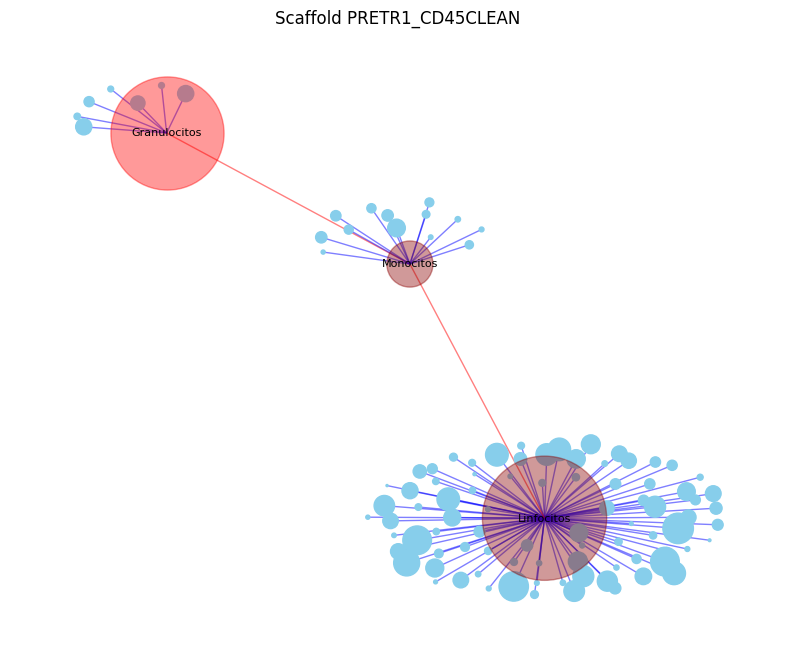

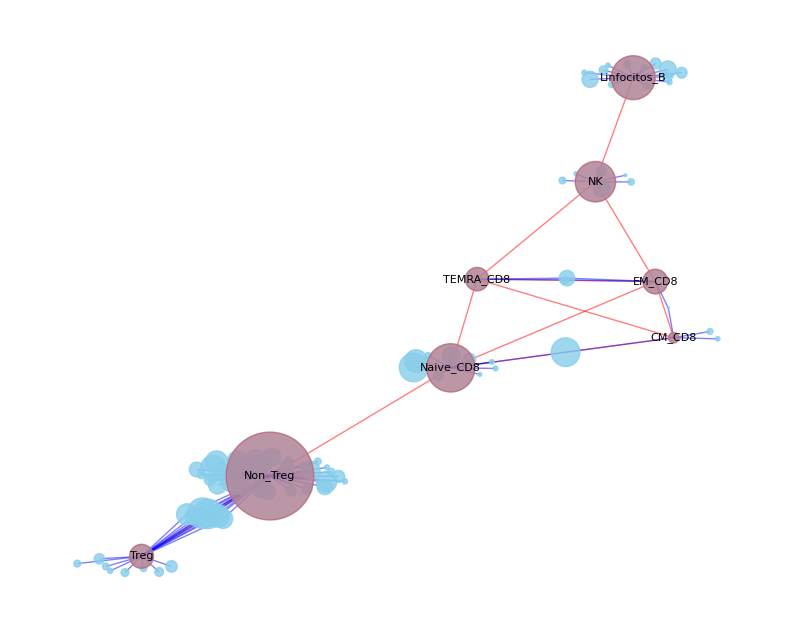

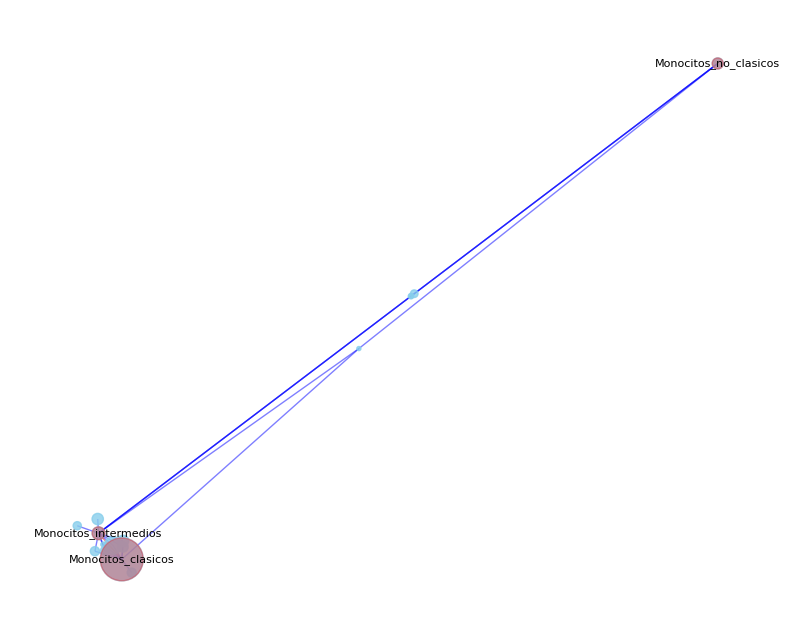

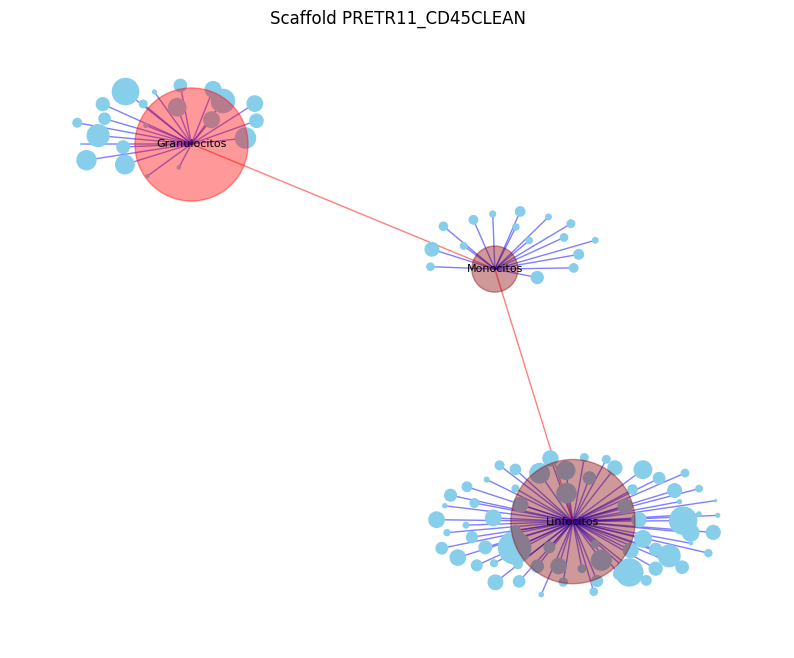

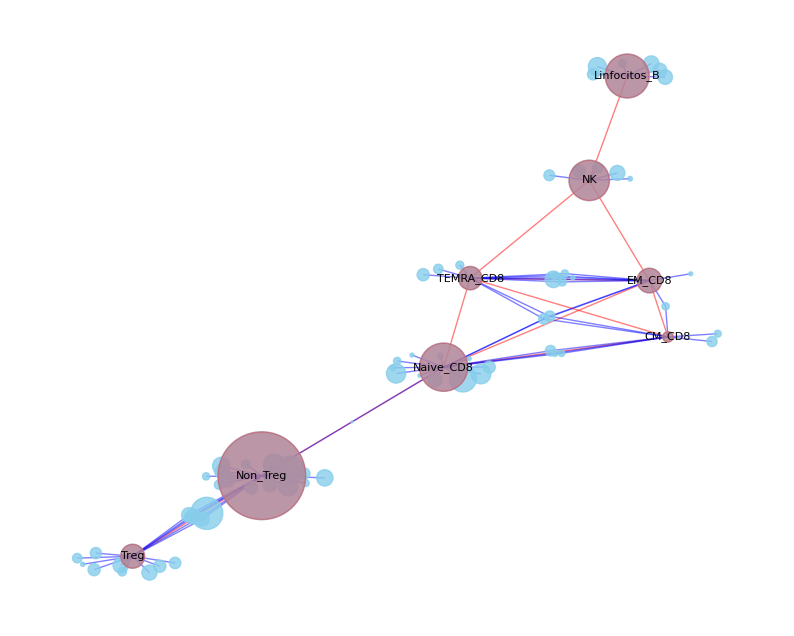

...

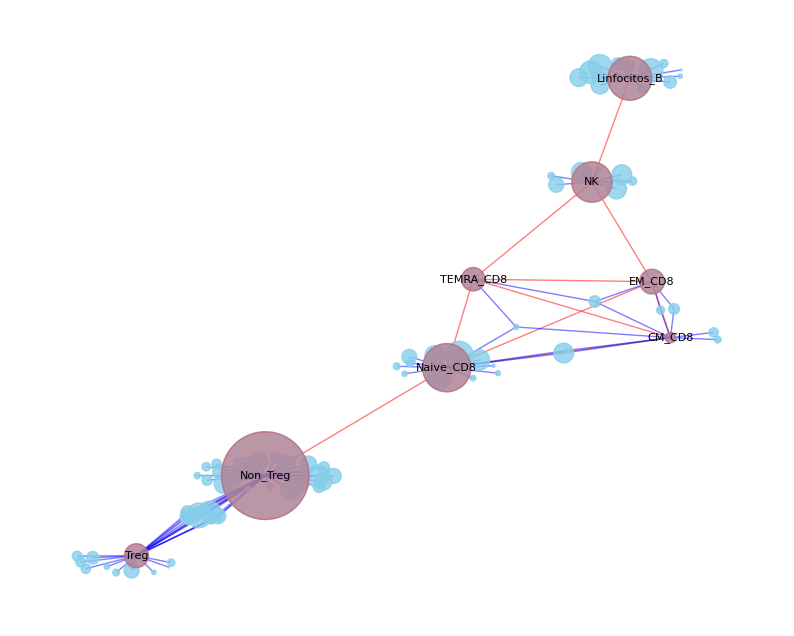

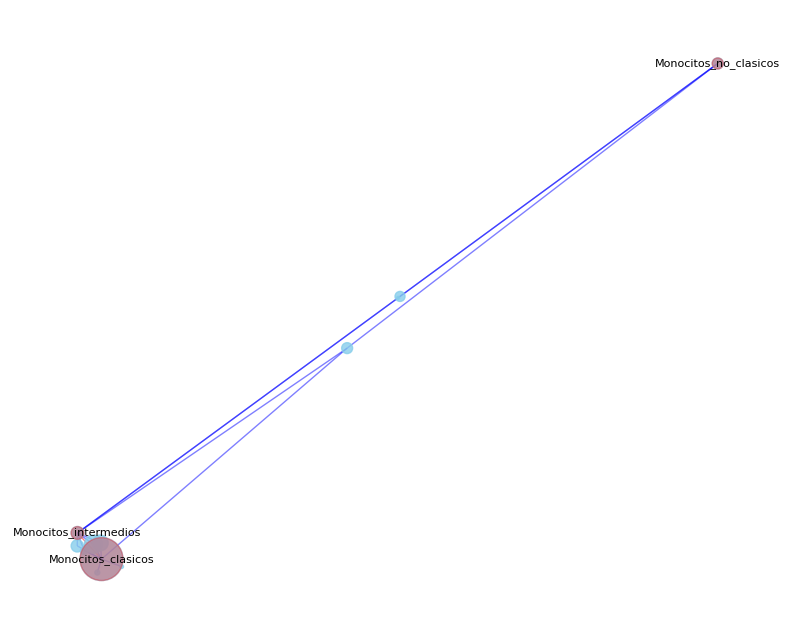

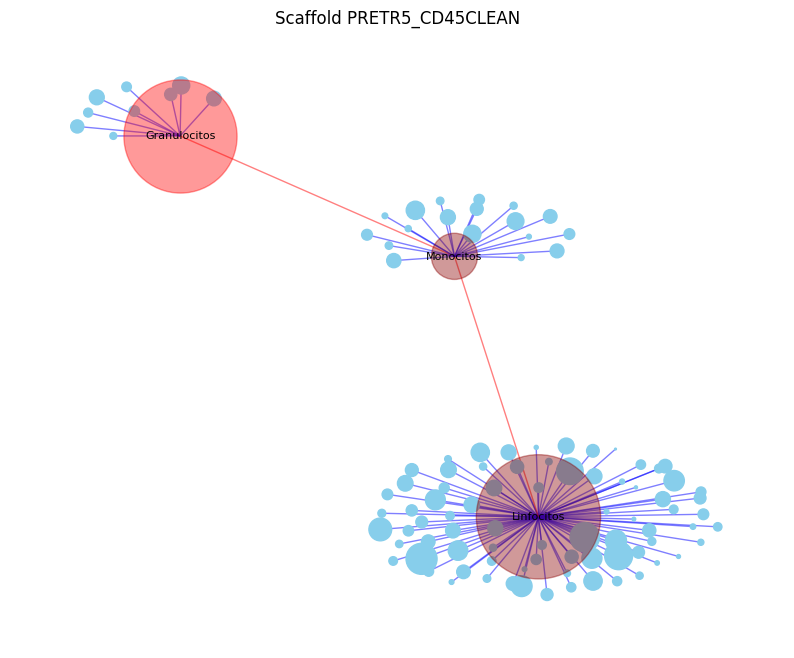

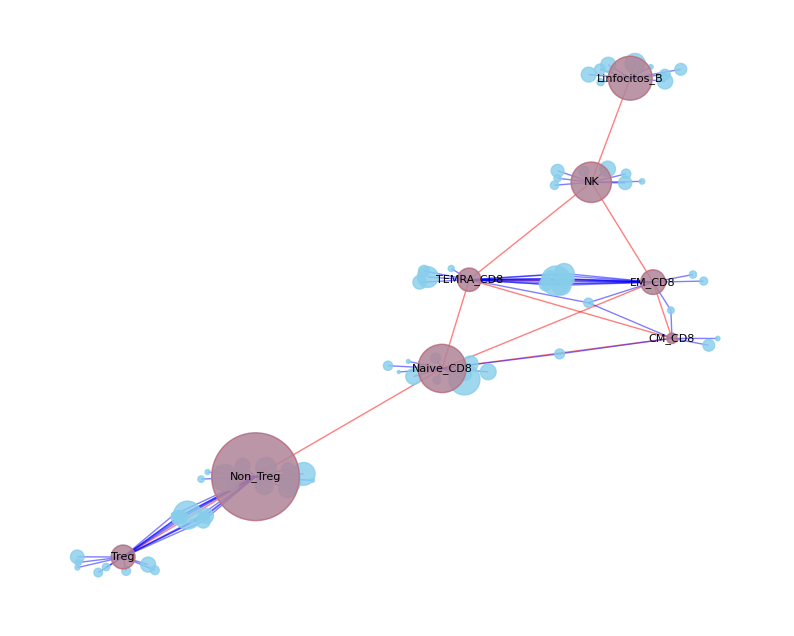

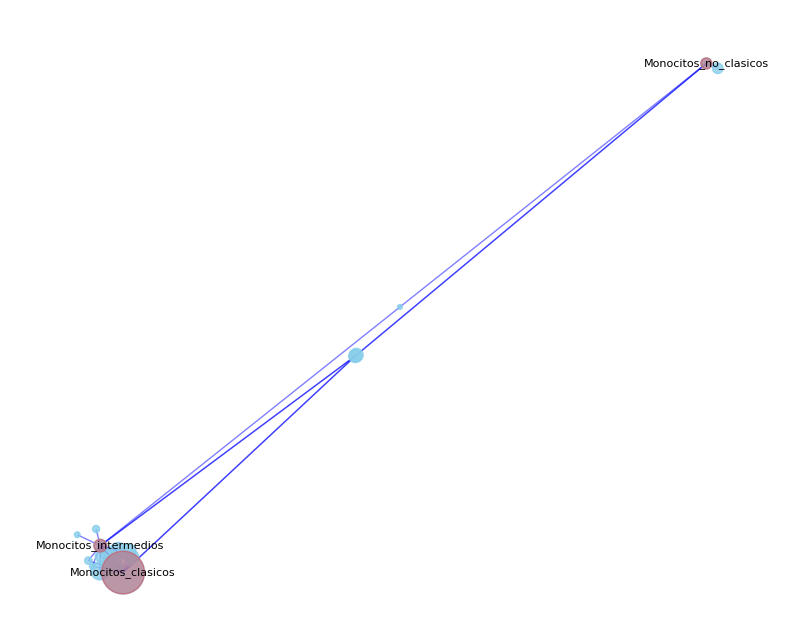

In [81]:
#jerarquia = {}
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    if archivo.endswith('.csv'):
        df_cluster = pd.read_csv(archivo_path)

        # Eliminar las columnas condition, batch, sample, id y label si existen
        columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
        df_cluster = df_cluster.drop(columns=[col for col in columnas_a_eliminar if col in df_cluster.columns]) 

        # Crear un nombre de variable basado en el nombre del archivo
        variable_name = os.path.splitext(archivo)[0].replace('.', '_').replace('-', '_')
        # Asignar el DataFrame a la variable dinámica
        globals()[variable_name] = df_cluster
    
        # Calcular las medianas de cada cluster en el DataFrame de clusters
        medianas_cluster = df_cluster.groupby('cluster').median()
        medianas_cluster = medianas_cluster.rename(index=lambda x: f"C_{x}")

        # Calcular las MEDIAS de cada cluster en el DataFrame de clusters
        medias_cluster = df_cluster.groupby('cluster').mean()
        medias_cluster = medias_cluster.rename(index=lambda x: f"C_{x}")

        medianas_todo = pd.concat([medianas_gating, medianas_cluster], axis=0)

        # Guardamos el nombre del archivo para poder buscar los archivos .fcs correspondientes
        archivo_nombre = limpiar_nombre_variable(os.path.splitext(archivo)[0])
        if archivo_nombre.endswith('_clusters'):
            archivo_nombre = archivo_nombre[:-9]

        # Crear una lista de nombres de nodos
        nodos_gating = medianas_gating.index.tolist()
        nodos_clusters = medianas_cluster.index.tolist()
        nodos = nodos_gating + nodos_clusters

        # Filtrar los DataFrames para obtener uno sin nodos hijos y otro sin nodos padre
        nodos_hijos = [nodo for subnodos in jerarquia.values() for nodo in subnodos]
        nodos_padre = list(jerarquia.keys())

        medianas_sin_padre = medianas_todo.drop(nodos_padre, errors='ignore')

        # Crear una matriz de similitud del coseno usando el DataFrame sin nodos padre
        valores_medianos = np.vstack([medianas_sin_padre.loc[nodo].values for nodo in medianas_sin_padre.index])
        matriz_similitud_coseno = cosine_similarity(valores_medianos)
        df_similitud_coseno = pd.DataFrame(matriz_similitud_coseno, index=medianas_sin_padre.index, columns=medianas_sin_padre.index)

        # Creamos el grafo ponderado
        G = nx.Graph()

        # Añadir nodos de jerarquía (solo nodos padre)
        for grupo in jerarquia.keys():
            G.add_node(grupo)  # Asegúrate de que se añaden los nodos padres

        # Crear el SCAFFOLD con los nodos de gating
        for nodo in nodos_gating:
            if nodo not in jerarquia:  # Solo añadir nodos de gating que no son padres
                G.add_node(nodo)

        # Calcular los umbrales de similitud para los nodos de gating
        submatriz_gating = matriz_similitud_coseno[:len(nodos_gating), :len(nodos_gating)]
        np.fill_diagonal(submatriz_gating, 0)  # Eliminar los valores de la diagonal principal
        umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)
        #umbrales_gating = 0.8

        # Calcular el umbral de similitud para los nodos de clusters y gating
        submatriz_clusters_gating = matriz_similitud_coseno[len(nodos_gating):, :len(nodos_gating)]
        umbrales_clusters_gating = 0.95

        # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
        for i in range(len(nodos_gating)):
            for j in range(i + 1, len(nodos_gating)):
                if matriz_similitud_coseno[i, j] >= umbrales_gating[j]:
                    G.add_edge(nodos_gating[i], nodos_gating[j], weight=matriz_similitud_coseno[i, j]**4)

        # Calcular las posiciones de los nodos de gating (usar k si los nodos de clusters estan demasiado cerca)
        pos_gating = nx.spring_layout(G, weight='weight', seed=2,k = 0.1)
        
        for key in pos_gating:
            pos_gating[key] *= 1 # Ajustar el factor de escala según sea necesario, cuanto mas grande, mas separados

        # Añadimos los nodos de los clusters, sin mover los nodos de gating
        for nodo in nodos_clusters:
            G.add_node(nodo)

        
        # Lista para almacenar los clusters unidos a cada nodo padre
        clusters_unidos_a_padre = {nodo_padre: [] for nodo_padre in jerarquia.keys()}
        
        # Añadir aristas solo entre nodos de clusters y nodos de gating basados en las similitudes de los nodos hijos
        # Añadir aristas entre nodos de gating y nodos de clusters
        for i in range(len(nodos_clusters)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **2) # Aumentamos la fuerza de la arista
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**2)
       
        

        # Agrupar nodos hijos bajo nodos padres
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Añadir aristas entre el nodo padre y sus vecinos (excluyendo otros hijos)
                    for vecino in list(G.neighbors(subnodo)):
                        if vecino not in subnodos:  # Asegúrate de no conectar con otros nodos hijos
                            G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                    G.remove_node(subnodo)  # Eliminar el nodo hijo después de añadir aristas

        # Esto se puede hacer después de haber eliminado los nodos hijos.
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Conectar el nodo padre a los nodos de clusters si es necesario
                    for nodo_cluster in nodos_clusters:
                        if G.has_edge(nodo_cluster, subnodo):
                            G.add_edge(grupo, nodo_cluster, weight=G[subnodo][nodo_cluster]['weight']**2)

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
        pos = nx.spring_layout(G, pos=pos_gating, fixed=nodos_gating, weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1)

        # Asignar colores a los nodos
        color_map = []
        for nodo in nodos:
            if nodo in nodos_gating:
                color_map.append('red')
            else:
                color_map.append('skyblue')
        
        # Asignar colores a las aristas
        edge_colors = []
        for u, v in G.edges():
            if u in nodos_gating and v in nodos_gating or  u in nodos_padre and v in nodos_gating or u in nodos_gating and v in nodos_padre or u in nodos_padre and v in nodos_padre:
                edge_colors.append('red')
            else:
                edge_colors.append('blue')

        # Calcular el tamaño de los nodos en base al número de eventos que contienen
        tamanos_nodos = {}
        for nodo in G.nodes:
            if nodo in nodos_padre:
                # Si el nodo es un nodo padre, sumar el número de eventos de sus nodos hijos
                num_eventos = sum(len(globals()[limpiar_nombre_variable(hijo)]) for hijo in jerarquia[nodo] if limpiar_nombre_variable(hijo) in globals())
                tamanos_nodos[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
            elif nodo in nodos_gating:
                num_eventos = len(globals()[limpiar_nombre_variable(nodo)])  # Calcula el número de eventos para los nodos de gating
                tamanos_nodos[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
            else:
                cluster_num = int(nodo.split('_')[1])
                num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                tamanos_nodos[nodo] = num_eventos * 0.1  # Ajustar el factor de escala según sea necesario
            

        nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]

        # Calcular el porcentaje de células asociadas a cada población de gating
        total_celulas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_clusters)
        porcentajes_poblaciones = {}
        for nodo_gating in nodos_gating:
            nodos_asociados = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_gating)]
            celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
            porcentajes_poblaciones[nodo_gating] = (celulas_asociadas / total_celulas) * 100

        # Calcular el porcentaje de células asociadas a cada nodo padre
        for nodo_padre in nodos_padre:
            nodos_asociados = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_padre)]
            celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
            porcentajes_poblaciones[nodo_padre] = (celulas_asociadas / total_celulas) * 100

        # Ajustar las posiciones de las etiquetas para que no estén directamente encima de los nodos
        pos_labels = {nodo: (pos[nodo][0], pos[nodo][1] + 0) for nodo in G.nodes if nodo in pos}

        # Dibujar el grafo
        edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

        fig, ax = plt.subplots(figsize=(10, 8))
        # Dibujar los nodos de clusters primero
        nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=nodos_clusters_conexos, node_color='skyblue', node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos])
        # Dibujar los nodos de gating después para que estén por encima
        nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
        tamanos_nodos_gating = [tamanos_nodos[nodo] for nodo in nodos_gating_con_pos]
        nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]
        tamanos_nodos_padre = [tamanos_nodos[nodo] for nodo in nodos_padre_con_pos]
        nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=nodos_gating_con_pos, node_color='red', node_size=tamanos_nodos_gating, alpha=0.4)
        nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=nodos_padre_con_pos, node_color='darkred', node_size=tamanos_nodos_padre, alpha=0.4)
        nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_colors, width=1.0, alpha=0.5)  # Ajustar alpha para reducir la opacidad de las aristas

        # Añadir etiquetas a los nodos de gating y nodos padre
        labels = {nodo: f"{nodo}" for nodo in nodos_gating if nodo in pos}
        labels.update({nodo: f"{nodo}" for nodo in nodos_padre if nodo in pos})
        nx.draw_networkx_labels(G, pos_labels, ax=ax, labels=labels, font_size=8, bbox=dict(facecolor='none', edgecolor='none', boxstyle='round,pad=0.3'))

        ax.axis('off')
        ax.set_title(f"Scaffold {archivo_nombre.split('-')[0]}")
        plt.show()









        # Para cada nodo padre, crear un grafo específico
        for nodo_padre in nodos_padre:
            # Crear un nuevo grafo específico para el nodo padre
            G_especifico = nx.Graph()

            # Obtener los nodos hijos del nodo padre
            nodos_hijos = jerarquia[nodo_padre]

            # Añadir nodos de gating hijos al grafo específico
            for nodo_hijo in nodos_hijos:
                if nodo_hijo in df_similitud_coseno.index:
                    G_especifico.add_node(nodo_hijo)

            # Filtrar la matriz de similitud del coseno para los nodos hijos
            indices_hijos = [nodos.index(nodo_hijo) for nodo_hijo in nodos_hijos if nodo_hijo in nodos]
            submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

            # Calcular los umbrales de similitud para los nodos de gating hijos
            np.fill_diagonal(submatriz_similitud_hijos, 0)  # Eliminar los valores de la diagonal principal
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 65, axis=0)

            # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
            for i in range(len(nodos_hijos)):
                for j in range(i + 1, len(nodos_hijos)):
                    if submatriz_similitud_hijos[i, j] >= umbrales_hijos[j]:
                        G_especifico.add_edge(nodos_hijos[i], nodos_hijos[j], weight=submatriz_similitud_hijos[i, j]**4)

            # Calcular las posiciones de los nodos de gating hijos 
            pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1, k = 0.1)
            
            for key in pos_hijos:
                pos_hijos[key] *= 1  # Ajustar el factor de escala según sea necesario

            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in nodos_clusters:
                for nodo_hijo in nodos_hijos:
                    if nodo_hijo in df_similitud_coseno.index and nodo_cluster in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(nodo_cluster, nodo_hijo, weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4)


            # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating hijos
            pos_especifico = nx.spring_layout(G_especifico, pos=pos_hijos, fixed=nodos_hijos, weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1)


            # Aumentar los pesos de las aristas entre nodos de clusters y nodos de gating
            for u, v, d in G_especifico.edges(data=True):
                if (u in nodos_clusters and v in nodos_gating) or (u in nodos_gating and v in nodos_clusters):
                    d['weight'] = d['weight'] ** 10  # Aumentar el peso de las aristas para reducir las distancias

            # Asignar colores a los nodos
            color_map_especifico = []
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    color_map_especifico.append('red')
                else:
                    color_map_especifico.append('lightblue')

            # Asignar colores a las aristas
            edge_colors_especifico = []
            for u, v in G_especifico.edges():
                if u in nodos_hijos and v in nodos_hijos:
                    edge_colors_especifico.append('red')
                else:
                    edge_colors_especifico.append('blue')

            # Calcular el tamaño de los nodos en base al número de eventos que contienen
            tamanos_nodos_especifico = {}
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    num_eventos = len(globals()[limpiar_nombre_variable(nodo)])  # Calcula el número de eventos para los nodos de gating hijos
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
                else:
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1  # Ajustar el factor de escala según sea necesario

            # Calcular el porcentaje de células asociadas a cada población de gating
            total_celulas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_clusters)
            porcentajes_poblaciones = {}
            # Calcular el porcentaje de células asociadas a cada nodo hijo
            for nodo_hijo in nodos_hijos:
                nodos_asociados = [nodo for nodo in nodos_clusters if G_especifico.has_edge(nodo, nodo_hijo)]
                celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
                porcentajes_poblaciones[nodo_hijo] = (celulas_asociadas / total_celulas) * 100

            # Dibujar el grafo específico
            edges_especifico, weights_especifico = zip(*nx.get_edge_attributes(G_especifico, 'weight').items())

            fig, ax = plt.subplots(figsize=(10, 8))

            # Dibujar los nodos de clusters primero
            nodos_clusters_conexos_especifico = [nodo for nodo in G_especifico.nodes if G_especifico.degree[nodo] > 0]
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico, ax=ax, 
                nodelist=nodos_clusters_conexos_especifico, 
                node_color='skyblue', 
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_clusters_conexos_especifico], 
                alpha=0.8
            )
            # Dibujar los nodos de gating hijos después para que estén por encima
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico, ax=ax, 
                nodelist=nodos_hijos, 
                node_color='red', 
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos], 
                alpha=0.3
            )
            nx.draw_networkx_edges(
                G_especifico, pos_especifico, ax=ax, 
                edge_color=edge_colors_especifico, 
                width=1.0, 
                alpha=0.5
            )
            # Ajustar las posiciones de las etiquetas para que no estén directamente encima de los nodos
            pos_labels = {nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0) for nodo in G_especifico.nodes if nodo in pos_especifico}

            # Añadir etiquetas a los nodos de gating hijos
            labels_especifico = {nodo: f"{nodo}" for nodo in nodos_hijos if nodo in pos_especifico}
            nx.draw_networkx_labels(G_especifico, pos_labels, ax=ax, labels=labels_especifico, font_size=8, bbox=dict(facecolor='none', edgecolor='none', boxstyle='round,pad=0.3'))

            ax.axis('off')
            #ax.set_title(f"Scaffold específico para {nodo_padre.split('-')[0]}")
            plt.show()

        print('\n \n \n \n')

Controles representados junto a las muestras

In [18]:
# Procesar los archivos de control y calcular las medias de los clusters de control
df_control = pd.DataFrame()
for control_file in archivos_controles:
    archivo_path = os.path.join(dir_clusters, control_file)
    df_temp = pd.read_csv(archivo_path)
    columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
    df_temp = df_temp.drop(columns=[col for col in columnas_a_eliminar if col in df_temp.columns])
    df_control = pd.concat([df_control, df_temp], ignore_index=True)

medianas_control = df_control.groupby('cluster').median()
medianas_control = medianas_control.rename(index=lambda x: f"C_{x}_Control")

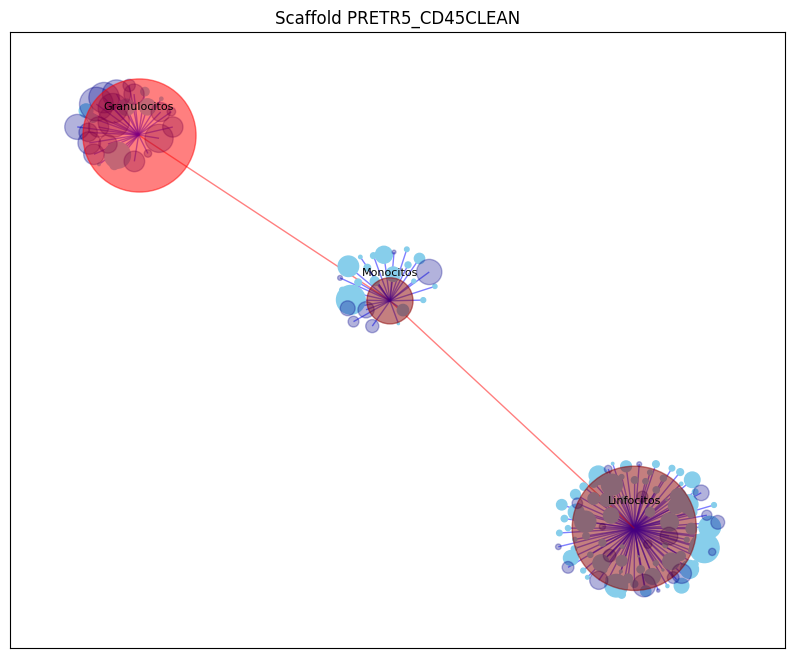

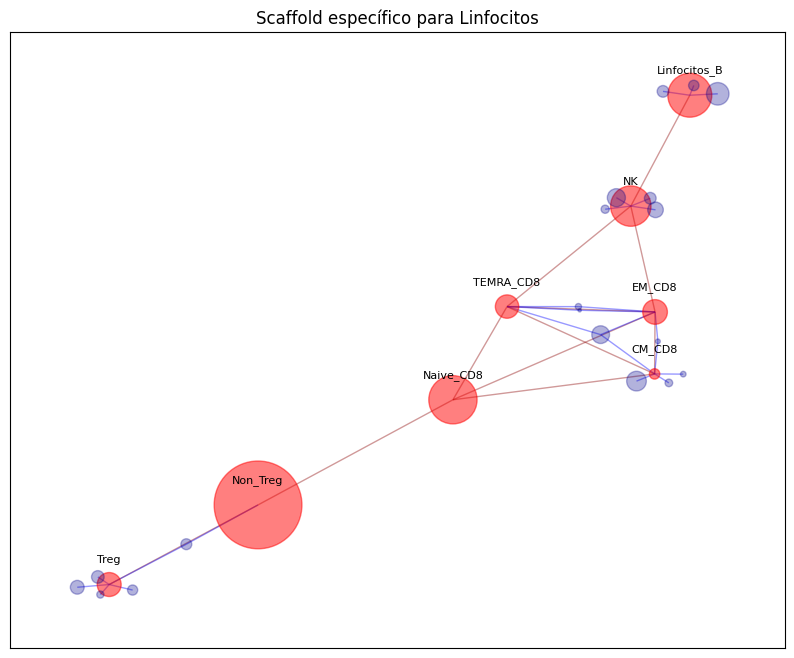

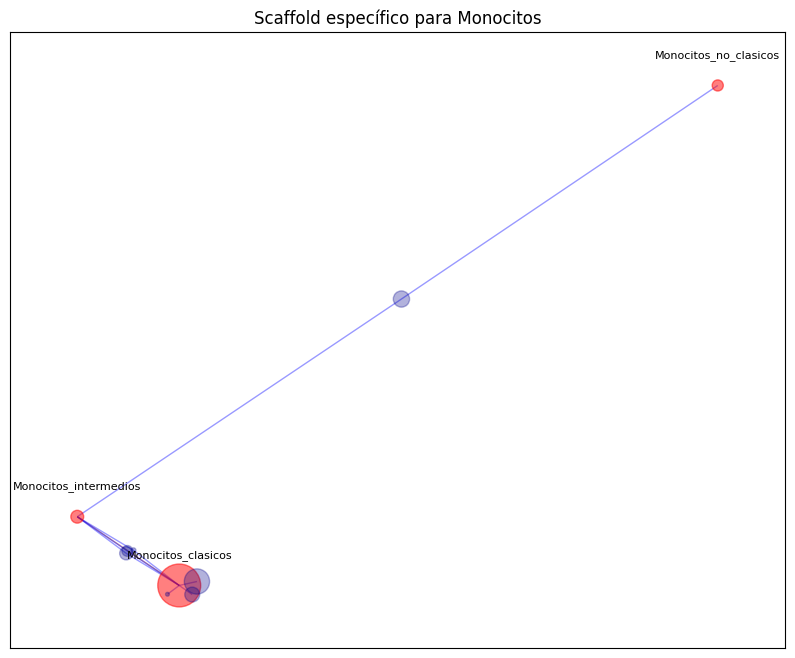

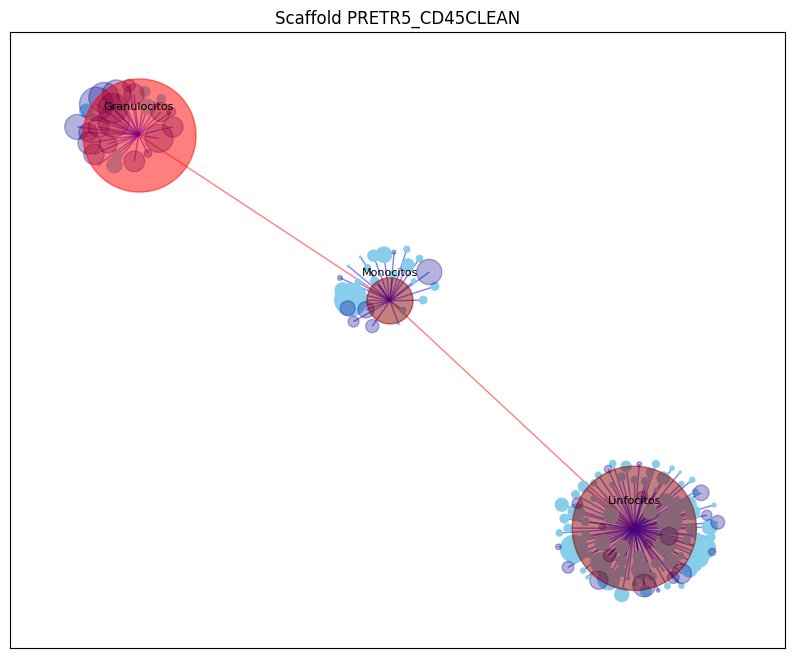

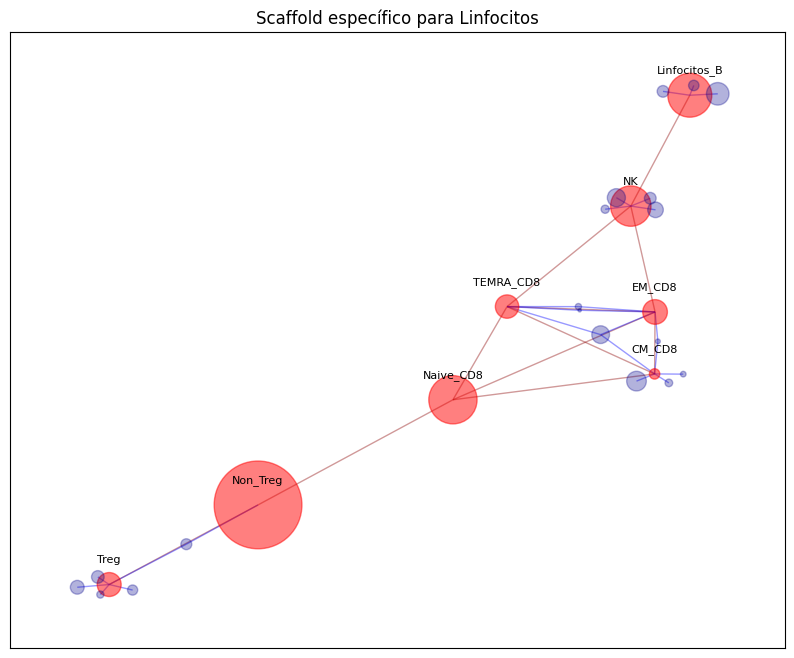

...

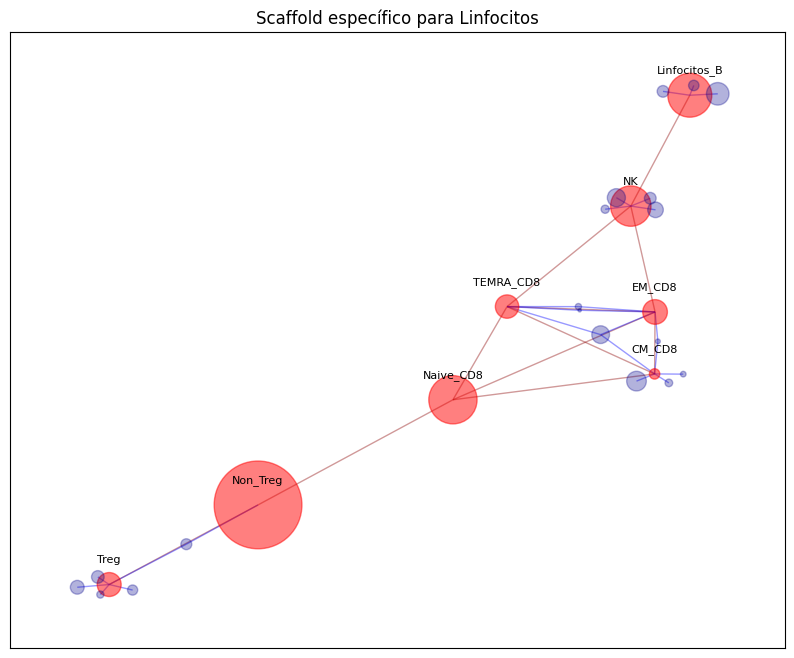

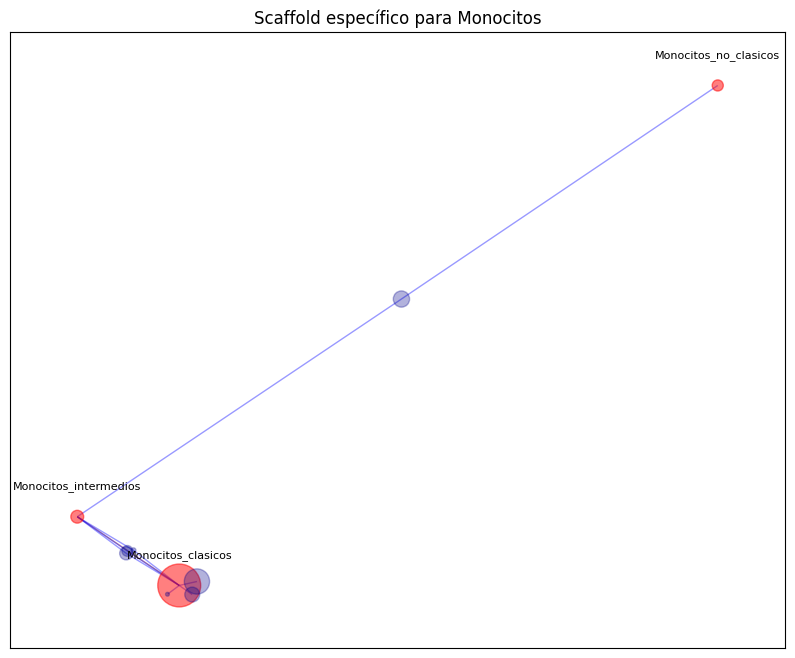

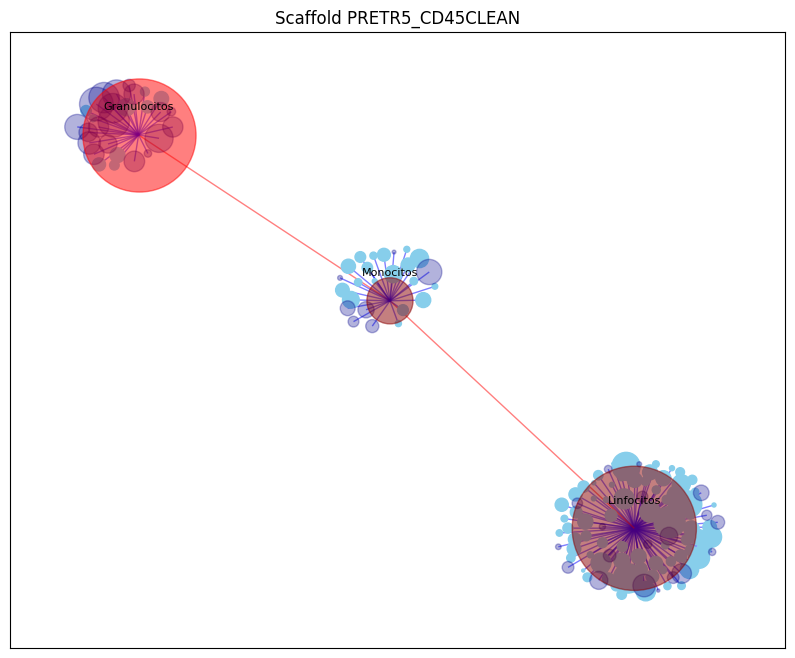

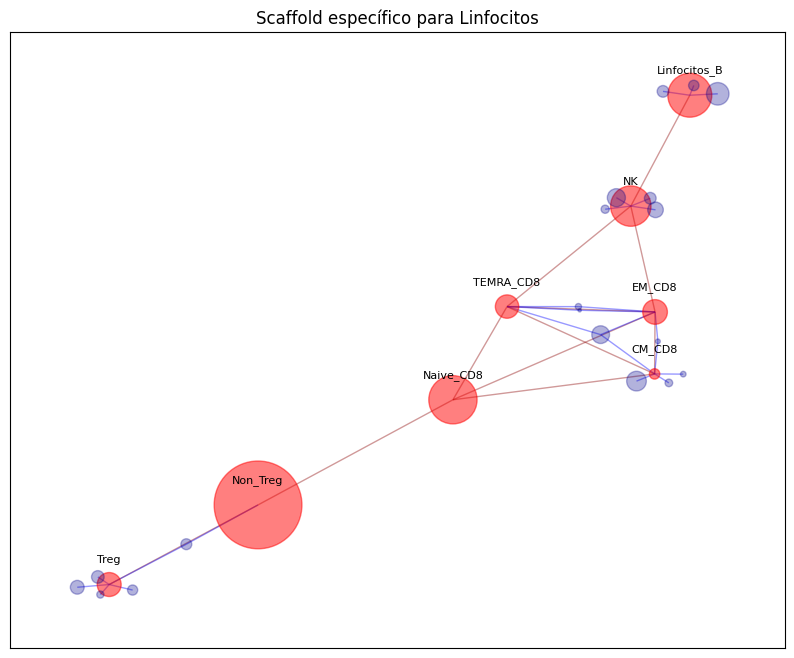

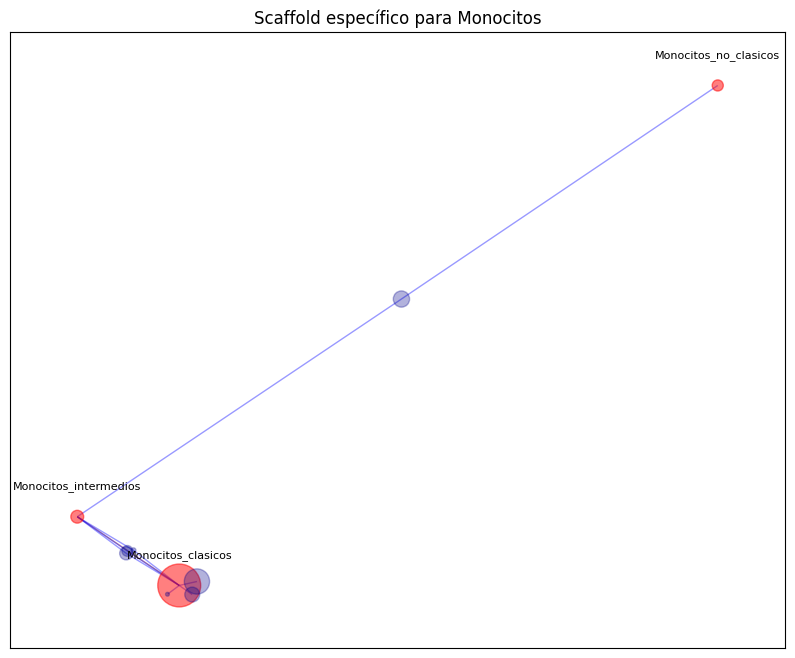

In [31]:
# Unificamos medianas sólo con gating y control (sin la muestra) fuera del bucle
medianas_todo_base = pd.concat([medianas_gating, medianas_control], axis=0)

# Definimos nodos gating, control y jerarquía permanentemente
nodos_gating = medianas_gating.index.tolist()
nodos_clusters_control = medianas_control.index.tolist()
nodos_padre = list(jerarquia.keys())
nodos_hijos = [nodo for subnodos in jerarquia.values() for nodo in subnodos]

# Excluimos nodos padre para construir la matriz de similitud base
medianas_sin_padre = medianas_todo_base.drop(nodos_padre, errors='ignore')

valores_medianas_base = np.vstack([medianas_sin_padre.loc[nodo].values for nodo in medianas_sin_padre.index])
matriz_similitud_coseno_base = cosine_similarity(valores_medianas_base)
df_similitud_coseno_base = pd.DataFrame(
    matriz_similitud_coseno_base,
    index=medianas_sin_padre.index,
    columns=medianas_sin_padre.index
)


tamanos_nodos_control = {}
for nodo_control in nodos_clusters_control:
    cluster_num = int(nodo_control.split('_')[1])
    num_eventos_control = len(df_control[df_control['cluster'] == cluster_num])
    tamanos_nodos_control[nodo_control] = num_eventos_control * 0.01


# Comenzar a procesar los archivos de muestras
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    if archivo.endswith('.csv'):
        df_cluster = pd.read_csv(archivo_path)

        # ...existing code para eliminar columnas, calcular medianas_cluster...
        medianas_cluster = df_cluster.groupby('cluster').median()
        medianas_cluster = medianas_cluster.rename(index=lambda x: f"C_{x}")

        # Concatenamos gating + control base + la muestra actual
        medianas_todo_muestra = pd.concat([medianas_todo_base, medianas_cluster], axis=0)

        # ...existing code para preparar nombres y variables...

        # Definimos nodos de la muestra (sin redefinir los de control)
        nodos_clusters = medianas_cluster.index.tolist()
        nodos = nodos_gating + nodos_clusters + nodos_clusters_control

        # Construimos una matriz de similitud específica para la muestra.
        # Aquí NO tocamos la parte de gating+control, que ya está en df_similitud_coseno_base
        medianas_sin_padre_muestra = medianas_todo_muestra.drop(nodos_padre, errors='ignore')

        # Mapear índices de gating+control base a la nueva subset
        # Recalculamos solo las filas extra de la muestra y unimos con df_similitud_coseno_base
        nuevos_nodos_muestra = [n for n in medianas_sin_padre_muestra.index if n not in df_similitud_coseno_base.index]
        # ...ejemplo simple...
        if nuevos_nodos_muestra:
            valores_medianas_muestra = np.vstack([medianas_sin_padre_muestra.loc[n].values for n in nuevos_nodos_muestra])
            # Calcula similitudes con la parte base
            similitudes_nuevos = cosine_similarity(valores_medianas_muestra, valores_medianas_base)
            # Calcula similitudes entre los nuevos
            similitudes_entre_nuevos = cosine_similarity(valores_medianas_muestra)

            # Unifica con df_similitud_coseno_base en una nueva df_similitud_coseno
            df_similitud_coseno = df_similitud_coseno_base.copy()
            # Agrega nuevas filas y columnas para la muestra
            for i, nodo_nuevo in enumerate(nuevos_nodos_muestra):
                fila_nueva = np.concatenate([similitudes_nuevos[i], similitudes_entre_nuevos[i]])
                # Este bloque puede requerir mayor detalle, aquí es un ejemplo
            # ...

        else:
            # Si no hay nodos nuevos, usamos la matriz base
            df_similitud_coseno = df_similitud_coseno_base.copy()


        # Creamos el grafo ponderado
        G = nx.Graph()

        # Añadir nodos de jerarquía (solo nodos padre)
        for grupo in jerarquia.keys():
            G.add_node(grupo)  # Asegúrate de que se añaden los nodos padres

        # Crear el SCAFFOLD con los nodos de gating
        for nodo in nodos_gating:
            if nodo not in jerarquia:  # Solo añadir nodos de gating que no son padres
                G.add_node(nodo)

        # Calcular los umbrales de similitud para los nodos de gating
        submatriz_gating = matriz_similitud_coseno[:len(nodos_gating), :len(nodos_gating)]
        np.fill_diagonal(submatriz_gating, 0)  # Eliminar los valores de la diagonal principal
        umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)

        # Calcular el umbral de similitud para los nodos de clusters y gating
        submatriz_clusters_gating = matriz_similitud_coseno[len(nodos_gating):, :len(nodos_gating)]
        umbrales_clusters_gating = 0.95

        # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
        for i in range(len(nodos_gating)):
            for j in range(i + 1, len(nodos_gating)):
                if matriz_similitud_coseno[i, j] >= umbrales_gating[j]:
                    G.add_edge(nodos_gating[i], nodos_gating[j], weight=matriz_similitud_coseno[i, j]**4)

        # Calcular las posiciones de los nodos de gating (NO USAR k)
        pos_gating = nx.spring_layout(G, weight='weight', seed=2)
        
        # Añadimos los nodos de los clusters, sin mover los nodos de gating
        for nodo in nodos_clusters:
            G.add_node(nodo)

        # Añadimos también los nodos de los clusters de control
        for nodo in nodos_clusters_control:
            G.add_node(nodo)

        # Añadir aristas solo entre nodos de clusters (muestra) y nodos de gating
        for i in range(len(nodos_clusters)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **4)
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)

        # Añadir aristas solo entre nodos de clusters de control y nodos de gating
        for i in range(len(nodos_clusters_control)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters_control[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters_control[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **4)
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters_control[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters_control[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)

        # Agrupar nodos hijos bajo nodos padres
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Añadir aristas entre el nodo padre y sus vecinos (excluyendo otros hijos)
                    for vecino in list(G.neighbors(subnodo)):
                        if vecino not in subnodos:
                            G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                    G.remove_node(subnodo)

        # Asegúrate de que los nodos padres están conectados a los nodos de clusters
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    for nodo_cluster in nodos_clusters:
                        if G.has_edge(nodo_cluster, subnodo):
                            G.add_edge(grupo, nodo_cluster, weight=G[subnodo][nodo_cluster]['weight']**2)

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
        pos = nx.spring_layout(
            G, pos=pos_gating, fixed=nodos_gating,
            weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1
        )

        # Asignar colores a los nodos
        color_map = []
        for nodo in G.nodes():
            if nodo in nodos_gating:
                color_map.append('red')
            elif nodo in nodos_clusters_control:
                color_map.append('darkblue')
            else:
                color_map.append('skyblue')
        
        # Asignar colores a las aristas
        edge_colors = []
        for u, v in G.edges():
            if (
                (u in nodos_gating and v in nodos_gating)
                or (u in nodos_padre and v in nodos_gating)
                or (u in nodos_gating and v in nodos_padre)
                or (u in nodos_padre and v in nodos_padre)
            ):
                edge_colors.append('red')
            else:
                edge_colors.append('blue')

        # Calcular el tamaño de los nodos en base al número de eventos que contienen
        tamanos_nodos = {}
        for nodo in G.nodes:
            if nodo in nodos_padre:
                num_eventos = sum(
                    len(globals()[limpiar_nombre_variable(hijo)])
                    for hijo in jerarquia[nodo]
                    if limpiar_nombre_variable(hijo) in globals()
                )
                tamanos_nodos[nodo] = num_eventos * 0.01
            elif nodo in nodos_gating:
                num_eventos = len(globals()[limpiar_nombre_variable(nodo)])
                tamanos_nodos[nodo] = num_eventos * 0.01
            elif nodo in nodos_clusters_control:
                # Usar el tamaño precalculado en tamanos_nodos_control
                tamanos_nodos[nodo] = tamanos_nodos_control.get(nodo, 10.0)
            else:
                # Aquí sí usamos df_cluster, puesto que es la muestra actual
                cluster_num = int(nodo.split('_')[1])
                num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                tamanos_nodos[nodo] = num_eventos * 0.1

        # Para dibujar sólo los clusters de muestra y de control que tengan conexiones
        nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]
        nodos_clusters_control_conexos = [nodo for nodo in nodos_clusters_control if G.degree(nodo) > 0]

        # Ajustar las posiciones de las etiquetas
        pos_labels = {
            nodo: (pos[nodo][0], pos[nodo][1] + 0.05)
            for nodo in G.nodes if nodo in pos
        }

        # Dibujar el grafo
        edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

        plt.figure(figsize=(10, 8))
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_clusters_conexos,
            node_color='skyblue',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos]
        )
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_clusters_control_conexos,
            node_color='darkblue',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_control_conexos],
            alpha = 0.3
        )
        nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
        tamanos_nodos_gating = [tamanos_nodos[nodo] for nodo in nodos_gating_con_pos]
        nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]
        tamanos_nodos_padre = [tamanos_nodos[nodo] for nodo in nodos_padre_con_pos]

        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_gating_con_pos,
            node_color='red',
            node_size=tamanos_nodos_gating,
            alpha=0.5
        )
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_padre_con_pos,
            node_color='darkred',
            node_size=tamanos_nodos_padre,
            alpha=0.5
        )
        nx.draw_networkx_edges(
            G, pos, edge_color=edge_colors,
            width=1.0, alpha=0.5
        )

        # Añadir etiquetas a los nodos de gating y nodos padre
        labels = {nodo: f"{nodo}" for nodo in nodos_gating if nodo in pos}
        labels.update({nodo: f"{nodo}" for nodo in nodos_padre if nodo in pos})

        nx.draw_networkx_labels(
            G, pos_labels, labels=labels,
            font_size=8,
            bbox=dict(facecolor='none', edgecolor='none', boxstyle='round,pad=0.3')
        )

        plt.title(f"Scaffold {archivo_nombre.split('-')[0]}")
        plt.show()






        # Para cada nodo padre, crear un grafo específico
        for nodo_padre in nodos_padre:
            G_especifico = nx.Graph()

            nodos_hijos = jerarquia[nodo_padre]

            # Añadir nodos de gating hijos al grafo específico
            for nodo_hijo in nodos_hijos:
                if nodo_hijo in df_similitud_coseno.index:
                    G_especifico.add_node(nodo_hijo)

            # Filtrar la matriz de similitud del coseno para los nodos hijos
            indices_hijos = [
                nodos.index(nodo_hijo) for nodo_hijo in nodos_hijos
                if nodo_hijo in nodos
            ]
            submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

            np.fill_diagonal(submatriz_similitud_hijos, 0)
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 70, axis=0)

            # Añadir aristas solo entre nodos similares basados en el umbral
            for i in range(len(nodos_hijos)):
                for j in range(i + 1, len(nodos_hijos)):
                    if submatriz_similitud_hijos[i, j] >= umbrales_hijos[j]:
                        G_especifico.add_edge(
                            nodos_hijos[i],
                            nodos_hijos[j],
                            weight=submatriz_similitud_hijos[i, j]**4
                        )

            pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1)
            for key in pos_hijos:
                pos_hijos[key] *= 1

            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in nodos_clusters:
                for nodo_hijo in nodos_hijos:
                    if (
                        nodo_hijo in df_similitud_coseno.index and
                        nodo_cluster in df_similitud_coseno.index
                    ):
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(
                                nodo_cluster,
                                nodo_hijo,
                                weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4
                            )

            # Añadir nodos de clusters de control conectados a los nodos hijos
            for nodo_cluster in nodos_clusters_control:
                for nodo_hijo in nodos_hijos:
                    if (
                        nodo_hijo in df_similitud_coseno.index and
                        nodo_cluster in df_similitud_coseno.index
                    ):
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(
                                nodo_cluster,
                                nodo_hijo,
                                weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4
                            )

            pos_especifico = nx.spring_layout(
                G_especifico, pos=pos_hijos, fixed=nodos_hijos,
                weight='weight',
                k=0.02/np.mean(matriz_similitud_coseno),
                seed=1
            )

            # Aumentar los pesos de las aristas entre nodos de clusters y gating
            for u, v, d in G_especifico.edges(data=True):
                if (u in nodos_clusters and v in nodos_gating) or (u in nodos_gating and v in nodos_clusters):
                    d['weight'] = d['weight'] ** 10

            # Asignar colores a los nodos
            color_map_especifico = []
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    color_map_especifico.append('darkred')
                elif nodo in nodos_clusters_control:
                    color_map_especifico.append('darkblue')
                else:
                    color_map_especifico.append('skyblue')

            # Asignar colores a las aristas
            edge_colors_especifico = []
            for u, v in G_especifico.edges():
                if u in nodos_hijos and v in nodos_hijos:
                    edge_colors_especifico.append('darkred')
                else:
                    edge_colors_especifico.append('blue')

            # Calcular el tamaño de los nodos en base al número de eventos
            tamanos_nodos_especifico = {}
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    num_eventos = len(globals()[limpiar_nombre_variable(nodo)])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.01
                elif nodo in nodos_clusters_control:
                    # Usar el tamaño precalculado de control
                    tamanos_nodos_especifico[nodo] = tamanos_nodos_control.get(nodo, 10.0)
                else:
                    # Para clusters de la muestra, usar df_cluster local
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1


            # Filtramos los clusters en este subgrafo que no tengan conexiones
            nodos_clusters_conexos_especifico = [
                nodo for nodo in G_especifico.nodes if G_especifico.degree[nodo] > 0
            ]
            nodos_clusters_control_conexos_especifico = [
                nc for nc in nodos_clusters_control
                if nc in G_especifico and G_especifico.degree[nc] > 0
            ]

            # Dibujar el grafo específico
            plt.figure(figsize=(10, 8))
            # Primero clusters de muestra conectados
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=[n for n in G_especifico.nodes if (n in nodos_clusters and G_especifico.degree[n] > 0)],
                node_color='skyblue',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in G_especifico.nodes if nodo in nodos_clusters],
                alpha=0.9
            )
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_hijos,
                node_color='red',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos],
                alpha=0.5
            )
            nodos_clusters_control_conexos_especifico = [
                nc for nc in nodos_clusters_control
                if nc in G_especifico and G_especifico.degree[nc] > 0
            ]
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_clusters_control_conexos_especifico,
                node_color='darkblue',
                node_size=[tamanos_nodos_especifico[nc] for nc in nodos_clusters_control_conexos_especifico],
                alpha=0.3
            )

            nx.draw_networkx_edges(
                G_especifico, pos_especifico,
                edge_color=edge_colors_especifico,
                width=1.0,
                alpha=0.4
            )

            pos_labels = {
                nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0.1)
                for nodo in G_especifico.nodes if nodo in pos_especifico
            }
            labels_especifico = {
                nodo: f"{nodo}"
                for nodo in nodos_hijos if nodo in pos_especifico
            }

            nx.draw_networkx_labels(
                G_especifico, pos_labels,
                labels=labels_especifico,
                font_size=8,
                bbox=dict(facecolor='none', edgecolor='none', boxstyle='round,pad=0.3')
            )

            plt.title(f"Scaffold específico para {nodo_padre.split('-')[0]}")
            plt.show()

        print('\n \n \n \n')

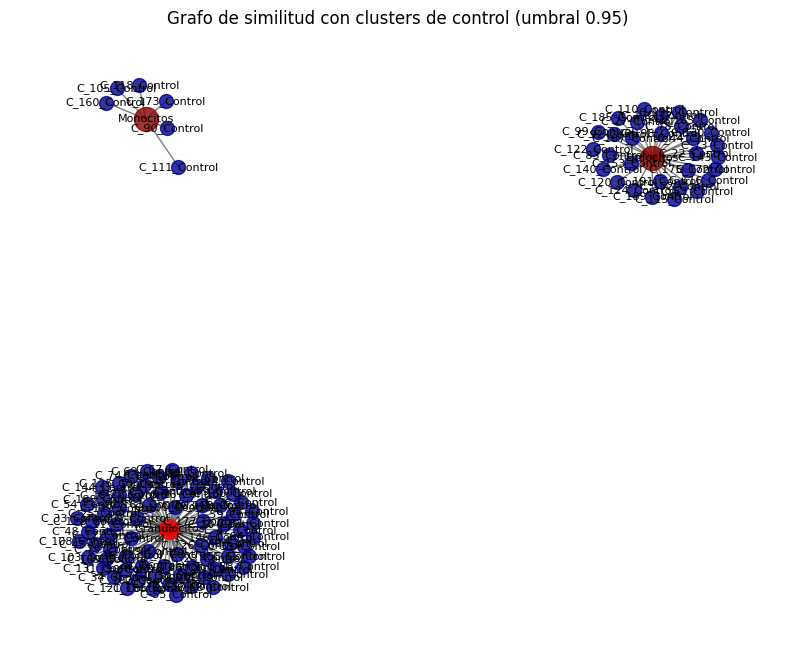

In [27]:
# Definir nodos y umbrales
nodos_gating = medianas_gating.index.tolist()
nodos_clusters_control = medianas_control.index.tolist()
nodos = nodos_gating + nodos_clusters_control
umbrales_clusters_gating = 0.95

# Crear grafo
G = nx.Graph()

# Añadir nodos padre y gating
for grupo in jerarquia.keys():
    G.add_node(grupo, tipo='padre')
for nodo in nodos_gating:
    if nodo not in jerarquia:
        G.add_node(nodo, tipo='gating')

# Calcular matriz de similitud
valores_medianas = np.vstack([
    medianas_gating.values,
    medianas_control.values
])
matriz_similitud_coseno = cosine_similarity(valores_medianas)
df_similitud_coseno = pd.DataFrame(matriz_similitud_coseno, index=nodos, columns=nodos)

# Añadir solo clusters que superen el umbral con algún nodo gating
for i, cluster in enumerate(nodos_clusters_control):
    idx_cluster = nodos.index(cluster)
    conexiones = False
    
    for j, nodo_gating in enumerate(nodos_gating):
        if nodo_gating in jerarquia:
            # Si es nodo padre, revisar similitud con sus hijos
            for hijo in jerarquia[nodo_gating]:
                if hijo in df_similitud_coseno.index:
                    idx_hijo = nodos.index(hijo)
                    if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                        G.add_node(cluster, tipo='control')
                        G.add_edge(cluster, nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4)
                        conexiones = True
        else:
            # Si no es padre, revisar similitud directa
            idx_gating = nodos.index(nodo_gating)
            if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                G.add_node(cluster, tipo='control')
                G.add_edge(cluster, nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)
                conexiones = True

# Agrupar nodos bajo padres
for padre, hijos in jerarquia.items():
    for hijo in hijos:
        if hijo in G:
            for vecino in list(G.neighbors(hijo)):
                if vecino not in hijos:
                    G.add_edge(padre, vecino, weight=G[hijo][vecino]['weight'])
            G.remove_node(hijo)

# Visualizar
pos = nx.spring_layout(G, seed=1)
plt.figure(figsize=(10,8))

# Dibujar nodos por tipo
nx.draw_networkx_nodes(G, pos,
    nodelist=[n for n,d in G.nodes(data=True) if d['tipo']=='padre'],
    node_color='darkred', node_size=300, alpha=0.8)
nx.draw_networkx_nodes(G, pos,
    nodelist=[n for n,d in G.nodes(data=True) if d['tipo']=='gating'],
    node_color='red', node_size=200, alpha=0.8)
nx.draw_networkx_nodes(G, pos,
    nodelist=[n for n,d in G.nodes(data=True) if d['tipo']=='control'],
    node_color='darkblue', node_size=100, alpha=0.8)

# Dibujar aristas
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Etiquetas
nx.draw_networkx_labels(G, pos, font_size=8)

plt.title("Grafo de similitud con clusters de control (umbral 0.95)")
plt.axis('off')
plt.show()

### Medias

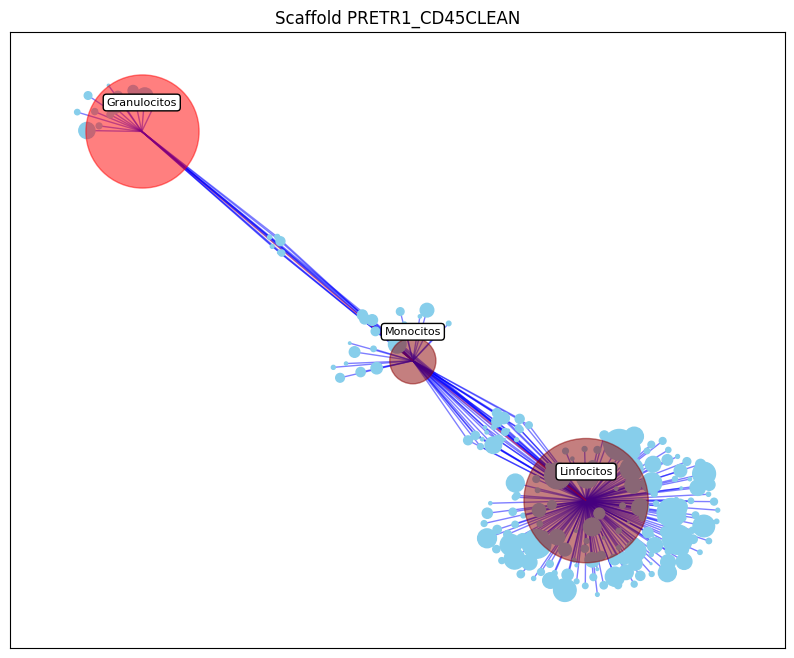

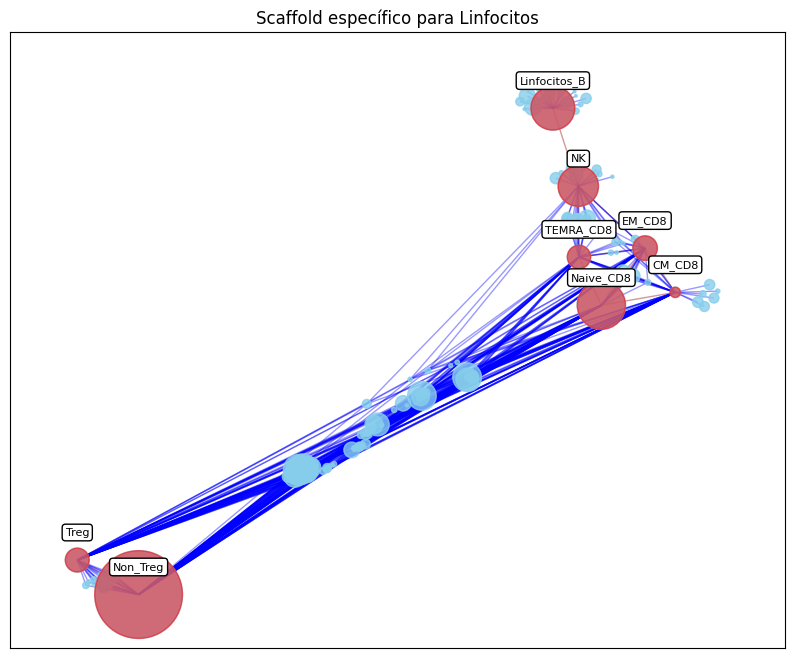

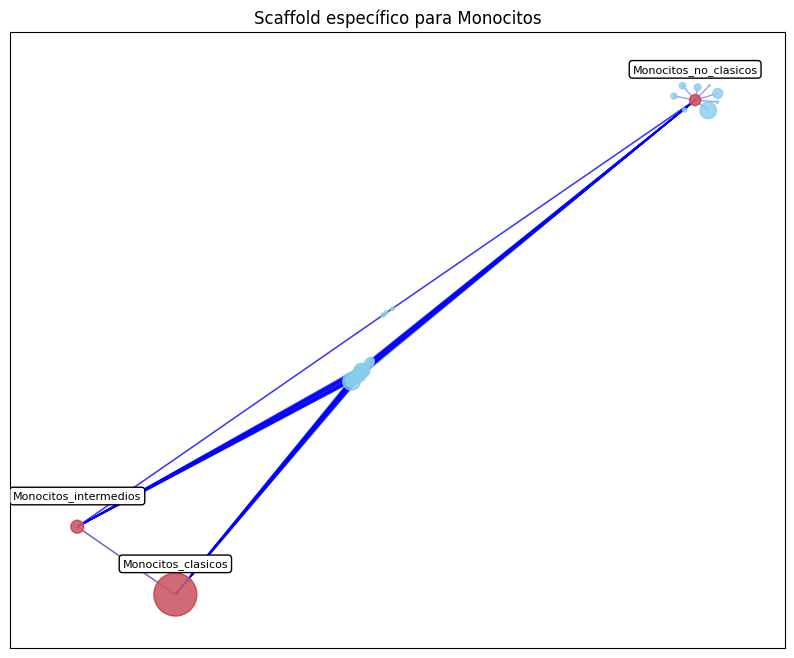

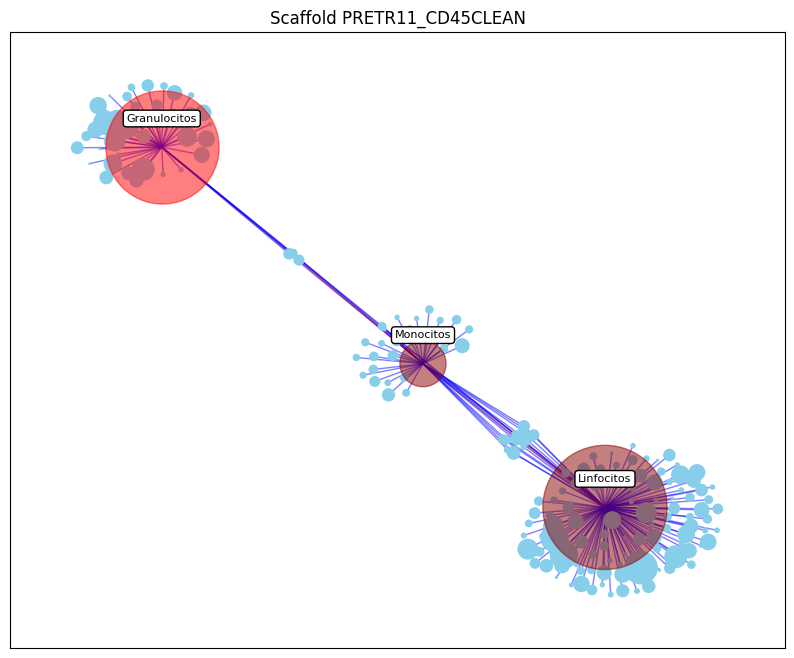

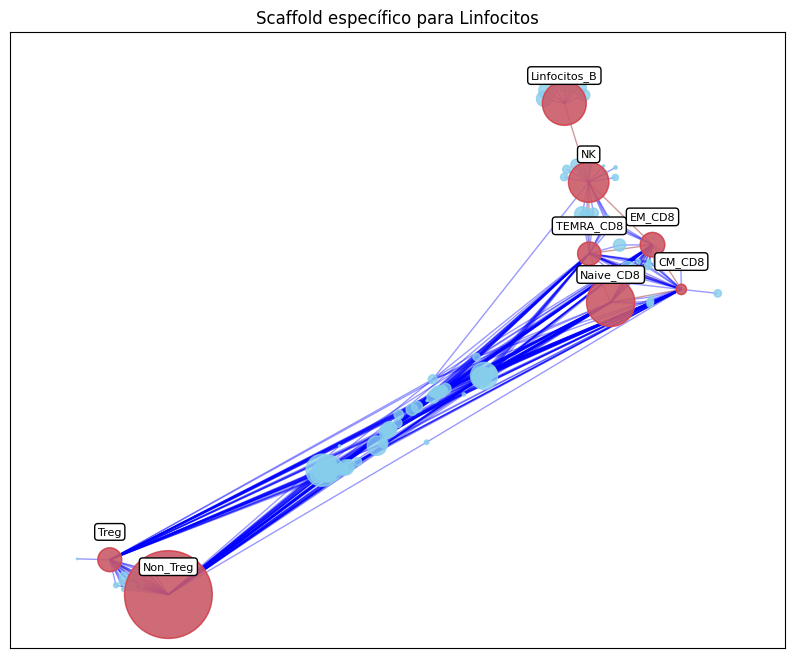

...

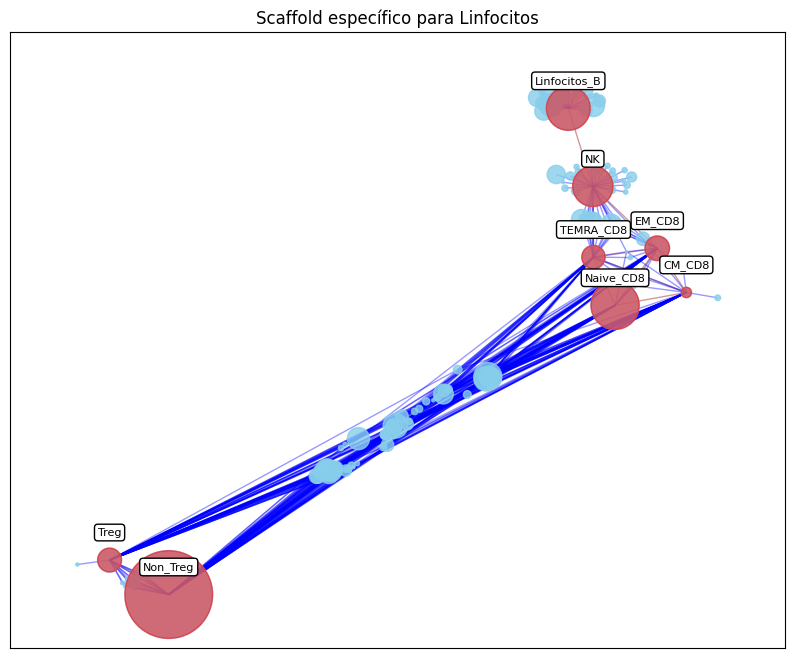

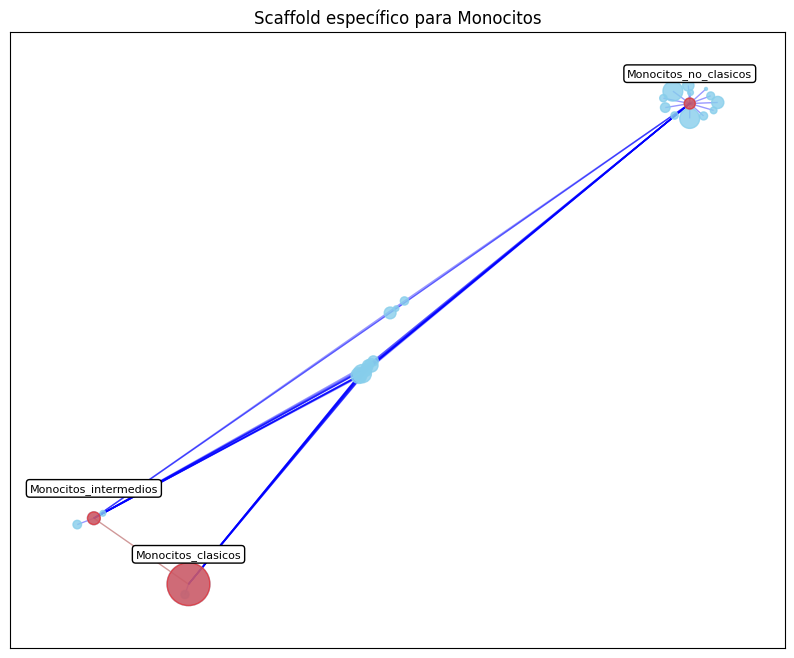

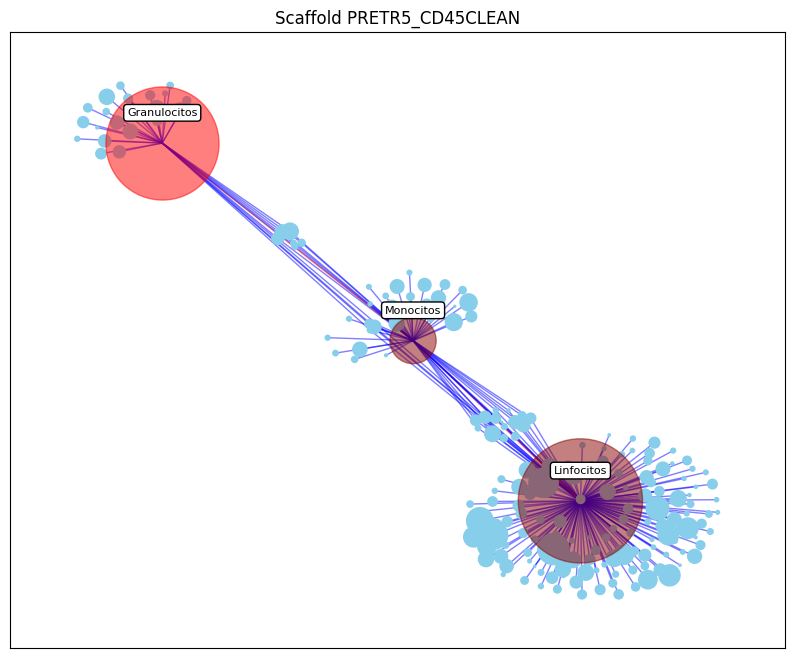

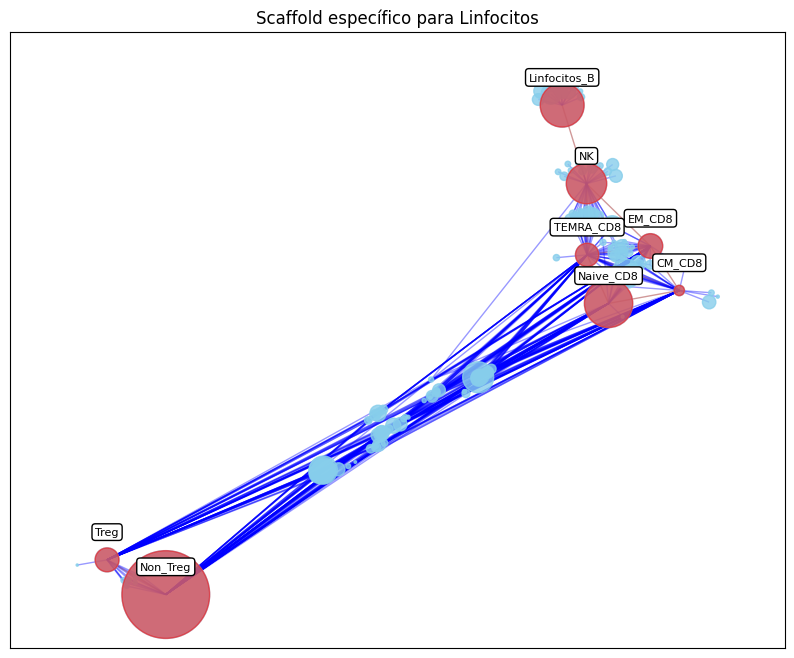

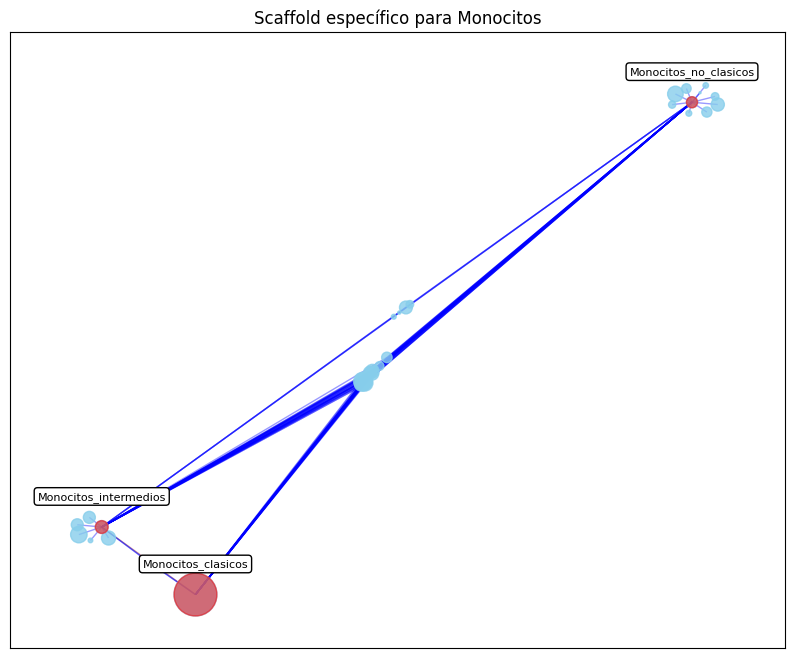

In [13]:
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    if archivo.endswith('.csv'):
        df_cluster = pd.read_csv(archivo_path)

        # Eliminar las columnas condition, batch, sample, id y label si existen
        columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
        df_cluster = df_cluster.drop(columns=[col for col in columnas_a_eliminar if col in df_cluster.columns]) 

        # Crear un nombre de variable basado en el nombre del archivo
        variable_name = os.path.splitext(archivo)[0].replace('.', '_').replace('-', '_')
        # Asignar el DataFrame a la variable dinámica
        globals()[variable_name] = df_cluster
    
        # Calcular las medianas de cada cluster en el DataFrame de clusters
        medianas_cluster = df_cluster.groupby('cluster').median()
        medianas_cluster = medianas_cluster.rename(index=lambda x: f"C_{x}")

        # Calcular las MEDIAS de cada cluster en el DataFrame de clusters
        medias_cluster = df_cluster.groupby('cluster').mean()
        medias_cluster = medias_cluster.rename(index=lambda x: f"C_{x}")

        medias_todo = pd.concat([medias_gating, medias_cluster], axis=0)

        # Guardamos el nombre del archivo para poder buscar los archivos .fcs correspondientes
        archivo_nombre = limpiar_nombre_variable(os.path.splitext(archivo)[0])
        if archivo_nombre.endswith('_clusters'):
            archivo_nombre = archivo_nombre[:-9]

        # Crear una lista de nombres de nodos
        nodos_gating = medias_gating.index.tolist()
        nodos_clusters = medias_cluster.index.tolist()
        nodos = nodos_gating + nodos_clusters

        # Filtrar los DataFrames para obtener uno sin nodos hijos y otro sin nodos padre
        nodos_hijos = [nodo for subnodos in jerarquia.values() for nodo in subnodos]
        nodos_padre = list(jerarquia.keys())

        medias_sin_padre = medias_todo.drop(nodos_padre, errors='ignore')

        # Crear una matriz de similitud del coseno usando el DataFrame sin nodos padre
        valores_medios = np.vstack([medias_sin_padre.loc[nodo].values for nodo in medias_sin_padre.index])
        matriz_similitud_coseno = cosine_similarity(valores_medios)
        df_similitud_coseno = pd.DataFrame(matriz_similitud_coseno, index=medias_sin_padre.index, columns=medias_sin_padre.index)

        # Creamos el grafo ponderado
        G = nx.Graph()

        # Añadir nodos de jerarquía (solo nodos padre)
        for grupo in jerarquia.keys():
            G.add_node(grupo)  # Asegúrate de que se añaden los nodos padres

        # Crear el SCAFFOLD con los nodos de gating
        for nodo in nodos_gating:
            if nodo not in jerarquia:  # Solo añadir nodos de gating que no son padres
                G.add_node(nodo)

        # Calcular los umbrales de similitud para los nodos de gating
        submatriz_gating = matriz_similitud_coseno[:len(nodos_gating), :len(nodos_gating)]
        np.fill_diagonal(submatriz_gating, 0)  # Eliminar los valores de la diagonal principal
        umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)
        #umbrales_gating = 0.8

        # Calcular el umbral de similitud para los nodos de clusters y gating
        submatriz_clusters_gating = matriz_similitud_coseno[len(nodos_gating):, :len(nodos_gating)]
        umbrales_clusters_gating = 0.9

        # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
        for i in range(len(nodos_gating)):
            for j in range(i + 1, len(nodos_gating)):
                if matriz_similitud_coseno[i, j] >= umbrales_gating[j]:
                    G.add_edge(nodos_gating[i], nodos_gating[j], weight=matriz_similitud_coseno[i, j]**4)

        # Calcular las posiciones de los nodos de gating (NO USAR k)
        pos_gating = nx.spring_layout(G, weight='weight', seed=2)
        
        # Añadimos los nodos de los clusters, sin mover los nodos de gating
        for nodo in nodos_clusters:
            G.add_node(nodo)

        
        # Lista para almacenar los clusters unidos a cada nodo padre
        clusters_unidos_a_padre = {nodo_padre: [] for nodo_padre in jerarquia.keys()}
        
        # Añadir aristas solo entre nodos de clusters y nodos de gating basados en las similitudes de los nodos hijos
        # Añadir aristas entre nodos de gating y nodos de clusters
        for i in range(len(nodos_clusters)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **4) # Aumentamos la fuerza de la arista
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)
       
        
        '''
        # Añadir aristas solo entre nodos de clusters y nodos de gating basados en las similitudes de los nodos hijos
        for i in range(len(nodos_clusters)):
            max_similitud = 0
            nodo_gating_mas_similar = None
            nodo_padre_asociado = None
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters[i])
                            idx_subnodo = nodos.index(subnodo)
                            similitud = matriz_similitud_coseno[idx_cluster, idx_subnodo]
                            if similitud > max_similitud:
                                max_similitud = similitud
                                nodo_gating_mas_similar = subnodo
                                nodo_padre_asociado = nodo_gating
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters[i])
                        idx_gating = nodos.index(nodo_gating)
                        similitud = matriz_similitud_coseno[idx_cluster, idx_gating]
                        if similitud > max_similitud:
                            max_similitud = similitud
                            nodo_gating_mas_similar = nodo_gating
                            nodo_padre_asociado = next((padre for padre, hijos in jerarquia.items() if nodo_gating in hijos), None)
            if max_similitud >= umbrales_clusters_gating:
                G.add_edge(nodos_clusters[i], nodo_gating_mas_similar, weight=max_similitud)
                if nodo_padre_asociado in jerarquia:
                    clusters_unidos_a_padre[nodo_padre_asociado].append(nodos_clusters[i])
            '''

        # Agrupar nodos hijos bajo nodos padres
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Añadir aristas entre el nodo padre y sus vecinos (excluyendo otros hijos)
                    for vecino in list(G.neighbors(subnodo)):
                        if vecino not in subnodos:  # Asegúrate de no conectar con otros nodos hijos
                            G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                    G.remove_node(subnodo)  # Eliminar el nodo hijo después de añadir aristas

        # Asegúrate de que los nodos padres están conectados a los nodos de clusters
        # Esto se puede hacer después de haber eliminado los nodos hijos.
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Conectar el nodo padre a los nodos de clusters si es necesario
                    for nodo_cluster in nodos_clusters:
                        if G.has_edge(nodo_cluster, subnodo):
                            G.add_edge(grupo, nodo_cluster, weight=G[subnodo][nodo_cluster]['weight']**2)

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
        pos = nx.spring_layout(G, pos=pos_gating, fixed=nodos_gating, weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1)

        # Asignar colores a los nodos
        color_map = []
        for nodo in nodos:
            if nodo in nodos_gating:
                color_map.append('red')
            else:
                color_map.append('skyblue')
        
        # Asignar colores a las aristas
        edge_colors = []
        for u, v in G.edges():
            if u in nodos_gating and v in nodos_gating or  u in nodos_padre and v in nodos_gating or u in nodos_gating and v in nodos_padre or u in nodos_padre and v in nodos_padre:
                edge_colors.append('red')
            else:
                edge_colors.append('blue')

        # Calcular el tamaño de los nodos en base al número de eventos que contienen
        tamanos_nodos = {}
        for nodo in G.nodes:
            if nodo in nodos_padre:
                # Si el nodo es un nodo padre, sumar el número de eventos de sus nodos hijos
                num_eventos = sum(len(globals()[limpiar_nombre_variable(hijo)]) for hijo in jerarquia[nodo] if limpiar_nombre_variable(hijo) in globals())
                tamanos_nodos[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
            elif nodo in nodos_gating:
                num_eventos = len(globals()[limpiar_nombre_variable(nodo)])  # Calcula el número de eventos para los nodos de gating
                tamanos_nodos[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
            else:
                cluster_num = int(nodo.split('_')[1])
                num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                tamanos_nodos[nodo] = num_eventos * 0.1  # Ajustar el factor de escala según sea necesario
            

        nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]

        # Calcular el porcentaje de células asociadas a cada población de gating
        total_celulas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_clusters)
        porcentajes_poblaciones = {}
        for nodo_gating in nodos_gating:
            nodos_asociados = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_gating)]
            celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
            porcentajes_poblaciones[nodo_gating] = (celulas_asociadas / total_celulas) * 100

        # Calcular el porcentaje de células asociadas a cada nodo padre
        for nodo_padre in nodos_padre:
            nodos_asociados = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_padre)]
            celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
            porcentajes_poblaciones[nodo_padre] = (celulas_asociadas / total_celulas) * 100

        # Ajustar las posiciones de las etiquetas para que no estén directamente encima de los nodos
        pos_labels = {nodo: (pos[nodo][0], pos[nodo][1] + 0.05) for nodo in G.nodes if nodo in pos}

        # Dibujar el grafo
        edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

        plt.figure(figsize=(10, 8))
        # Dibujar los nodos de clusters primero
        nx.draw_networkx_nodes(G, pos, nodelist=nodos_clusters_conexos, node_color='skyblue', node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos])
        # Dibujar los nodos de gating después para que estén por encima
        nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
        tamanos_nodos_gating = [tamanos_nodos[nodo] for nodo in nodos_gating_con_pos]
        nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]
        tamanos_nodos_padre = [tamanos_nodos[nodo] for nodo in nodos_padre_con_pos]
        nx.draw_networkx_nodes(G, pos, nodelist=nodos_gating_con_pos, node_color='red', node_size=tamanos_nodos_gating, alpha=0.5)
        nx.draw_networkx_nodes(G, pos, nodelist=nodos_padre_con_pos, node_color='darkred', node_size=tamanos_nodos_padre, alpha=0.5)
        nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=1.0, alpha=0.5)  # Ajustar alpha para reducir la opacidad de las aristas

        # Añadir etiquetas a los nodos de gating y nodos padre
        labels = {nodo: f"{nodo}" for nodo in nodos_gating if nodo in pos}
        labels.update({nodo: f"{nodo}" for nodo in nodos_padre if nodo in pos})
        '''labels = {nodo: f"{nodo}\n{porcentajes_poblaciones[nodo]:.2f}%" for nodo in nodos_gating if nodo in pos}
        labels.update({nodo: f"{nodo}\n{porcentajes_poblaciones[nodo]:.2f}%" for nodo in nodos_padre if nodo in pos})
        '''

        nx.draw_networkx_labels(G, pos_labels, labels=labels, font_size=8, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

        plt.title(f"Scaffold {archivo_nombre.split('-')[0]}")
        plt.show()









        # Para cada nodo padre, crear un grafo específico
        for nodo_padre in nodos_padre:
            # Crear un nuevo grafo específico para el nodo padre
            G_especifico = nx.Graph()

            # Obtener los nodos hijos del nodo padre
            nodos_hijos = jerarquia[nodo_padre]

            # Añadir nodos de gating hijos al grafo específico
            for nodo_hijo in nodos_hijos:
                if nodo_hijo in df_similitud_coseno.index:
                    G_especifico.add_node(nodo_hijo)

            # Filtrar la matriz de similitud del coseno para los nodos hijos
            indices_hijos = [nodos.index(nodo_hijo) for nodo_hijo in nodos_hijos if nodo_hijo in nodos]
            submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

            # Calcular los umbrales de similitud para los nodos de gating hijos
            np.fill_diagonal(submatriz_similitud_hijos, 0)  # Eliminar los valores de la diagonal principal
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 70, axis=0)
            #umbrales_hijos = 0.75

            # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
            for i in range(len(nodos_hijos)):
                for j in range(i + 1, len(nodos_hijos)):
                    if submatriz_similitud_hijos[i, j] >= umbrales_hijos[j]:
                        G_especifico.add_edge(nodos_hijos[i], nodos_hijos[j], weight=submatriz_similitud_hijos[i, j]**4)

            # Calcular las posiciones de los nodos de gating hijos (NO USAR k)
            pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1)
            
            for key in pos_hijos:
                pos_hijos[key] *= 1  # Ajustar el factor de escala según sea necesario

            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in nodos_clusters:
                for nodo_hijo in nodos_hijos:
                    if nodo_hijo in df_similitud_coseno.index and nodo_cluster in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(nodo_cluster, nodo_hijo, weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4)
            

            '''
            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in clusters_unidos_a_padre[nodo_padre]:
                max_similitud = 0
                nodo_hijo_mas_similar = None
                for nodo_hijo in nodos_hijos:
                    if nodo_hijo in df_similitud_coseno.index and nodo_cluster in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        similitud = matriz_similitud_coseno[idx_cluster, idx_hijo]
                        if similitud > max_similitud:
                            max_similitud = similitud
                            nodo_hijo_mas_similar = nodo_hijo
                if max_similitud >= umbrales_clusters_gating:
                    G_especifico.add_node(nodo_cluster)
                    G_especifico.add_edge(nodo_cluster, nodo_hijo_mas_similar, weight=max_similitud)
            '''


            # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating hijos
            pos_especifico = nx.spring_layout(G_especifico, pos=pos_hijos, fixed=nodos_hijos, weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1)


            # Aumentar los pesos de las aristas entre nodos de clusters y nodos de gating
            for u, v, d in G_especifico.edges(data=True):
                if (u in nodos_clusters and v in nodos_gating) or (u in nodos_gating and v in nodos_clusters):
                    d['weight'] = d['weight'] ** 10  # Aumentar el peso de las aristas para reducir las distancias

            # Asignar colores a los nodos
            color_map_especifico = []
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    color_map_especifico.append('darkred')
                else:
                    color_map_especifico.append('skyblue')

            # Asignar colores a las aristas
            edge_colors_especifico = []
            for u, v in G_especifico.edges():
                if u in nodos_hijos and v in nodos_hijos:
                    edge_colors_especifico.append('darkred')
                else:
                    edge_colors_especifico.append('blue')

            # Calcular el tamaño de los nodos en base al número de eventos que contienen
            tamanos_nodos_especifico = {}
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    num_eventos = len(globals()[limpiar_nombre_variable(nodo)])  # Calcula el número de eventos para los nodos de gating hijos
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.01  # Ajustar el factor de escala según sea necesario
                else:
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1  # Ajustar el factor de escala según sea necesario

            # Calcular el porcentaje de células asociadas a cada población de gating
            total_celulas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_clusters)
            porcentajes_poblaciones = {}
            # Calcular el porcentaje de células asociadas a cada nodo hijo
            for nodo_hijo in nodos_hijos:
                nodos_asociados = [nodo for nodo in nodos_clusters if G_especifico.has_edge(nodo, nodo_hijo)]
                celulas_asociadas = sum(len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados)
                porcentajes_poblaciones[nodo_hijo] = (celulas_asociadas / total_celulas) * 100

            # Dibujar el grafo específico
            edges_especifico, weights_especifico = zip(*nx.get_edge_attributes(G_especifico, 'weight').items())

            plt.figure(figsize=(10, 8))
            # Dibujar los nodos de clusters primero
            nodos_clusters_conexos_especifico = [nodo for nodo in G_especifico.nodes if G_especifico.degree[nodo] > 0]
            nx.draw_networkx_nodes(G_especifico, pos_especifico, nodelist=nodos_clusters_conexos_especifico, node_color='skyblue', node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_clusters_conexos_especifico], alpha =0.8)
            # Dibujar los nodos de gating hijos después para que estén por encima
            nx.draw_networkx_nodes(G_especifico, pos_especifico, nodelist=nodos_hijos, node_color='red', node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos], alpha=0.5)
            nx.draw_networkx_edges(G_especifico, pos_especifico, edge_color=edge_colors_especifico, width=1.0, alpha=0.4)  # Ajustar alpha para reducir la opacidad de las aristas

            # Ajustar las posiciones de las etiquetas para que no estén directamente encima de los nodos
            pos_labels = {nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0.1) for nodo in G_especifico.nodes if nodo in pos_especifico}

            # Añadir etiquetas a los nodos de gating hijos
            labels_especifico = {nodo: f"{nodo}" for nodo in nodos_hijos if nodo in pos_especifico}
            #labels_especifico = {nodo: f"{nodo}\n{porcentajes_poblaciones[nodo]:.2f}%" for nodo in nodos_hijos if nodo in pos_especifico}

            nx.draw_networkx_labels(G_especifico, pos_labels, labels=labels_especifico, font_size=8, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

            plt.title(f"Scaffold específico para {nodo_padre.split('-')[0]}")
            plt.show()

        print('\n \n \n \n')

Muestra controles junto a las muestras

In [14]:
# Procesar los archivos de control y calcular las medias de los clusters de control
df_control = pd.DataFrame()
for control_file in archivos_controles:
    archivo_path = os.path.join(dir_clusters, control_file)
    df_temp = pd.read_csv(archivo_path)
    columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
    df_temp = df_temp.drop(columns=[col for col in columnas_a_eliminar if col in df_temp.columns])
    df_control = pd.concat([df_control, df_temp], ignore_index=True)

medias_control = df_control.groupby('cluster').mean()
medias_control = medias_control.rename(index=lambda x: f"C_{x}_Control")

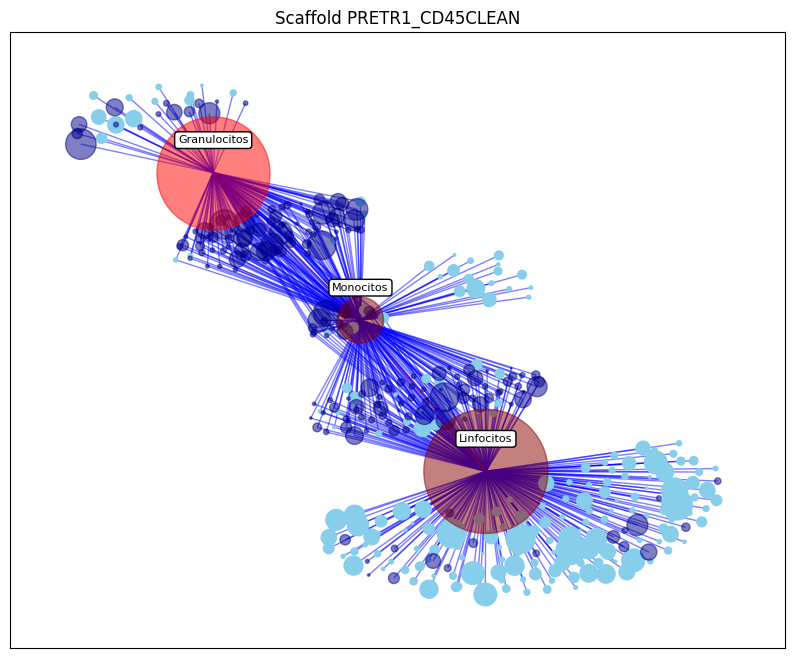

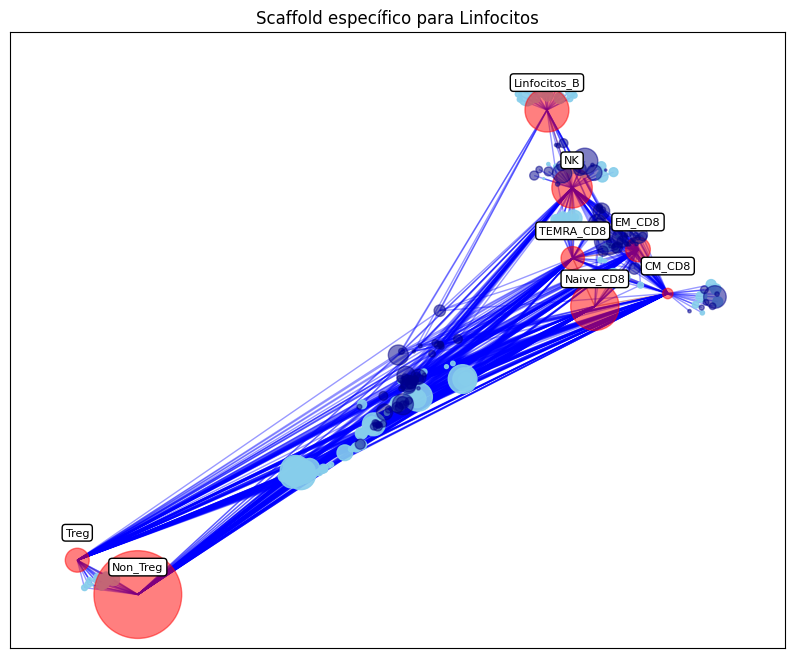

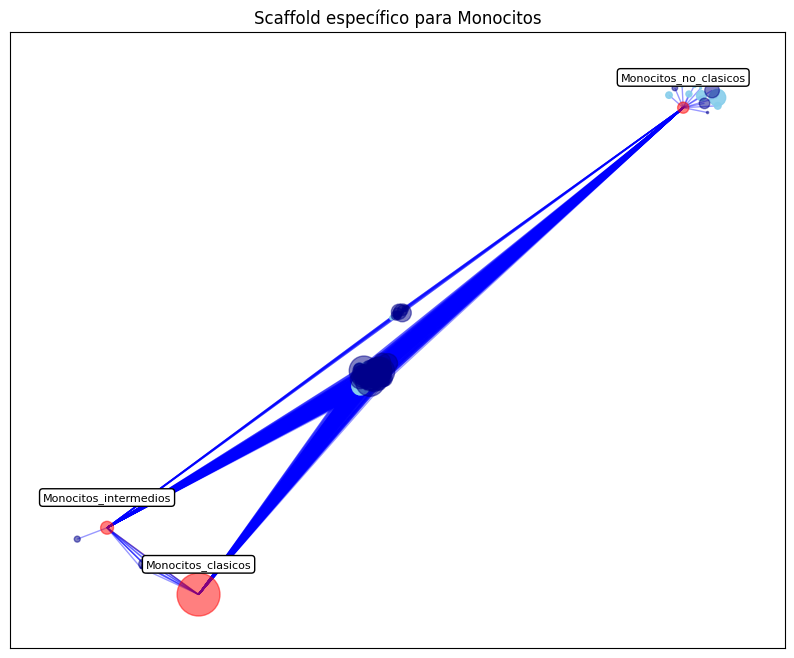

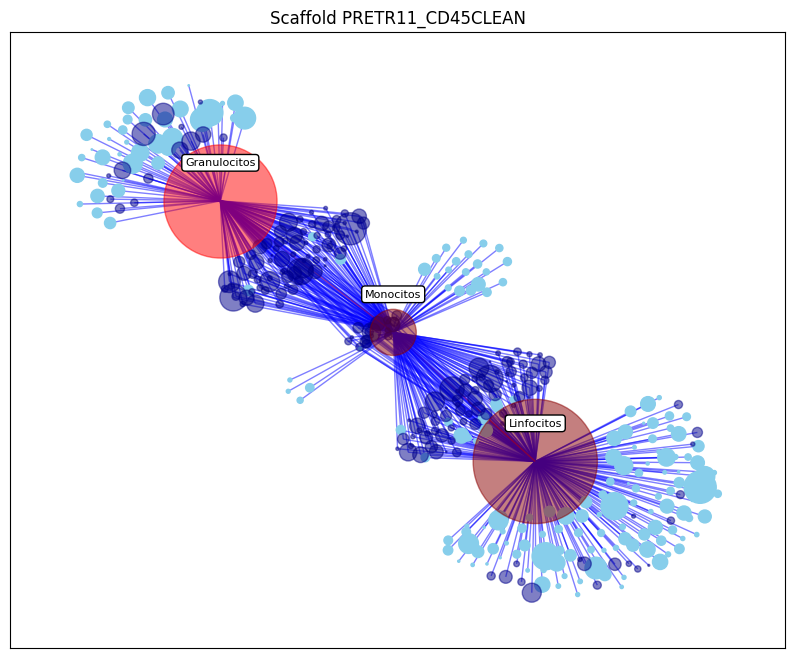

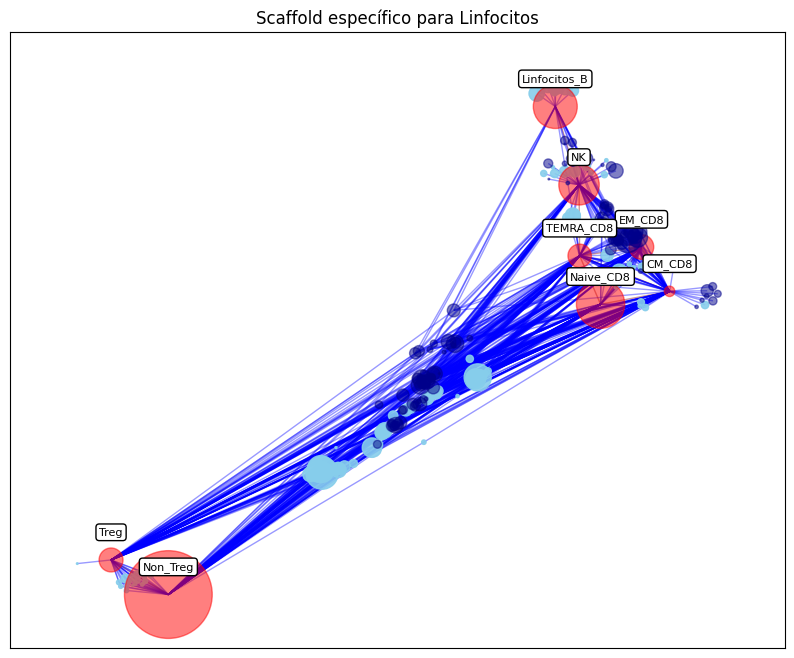

...

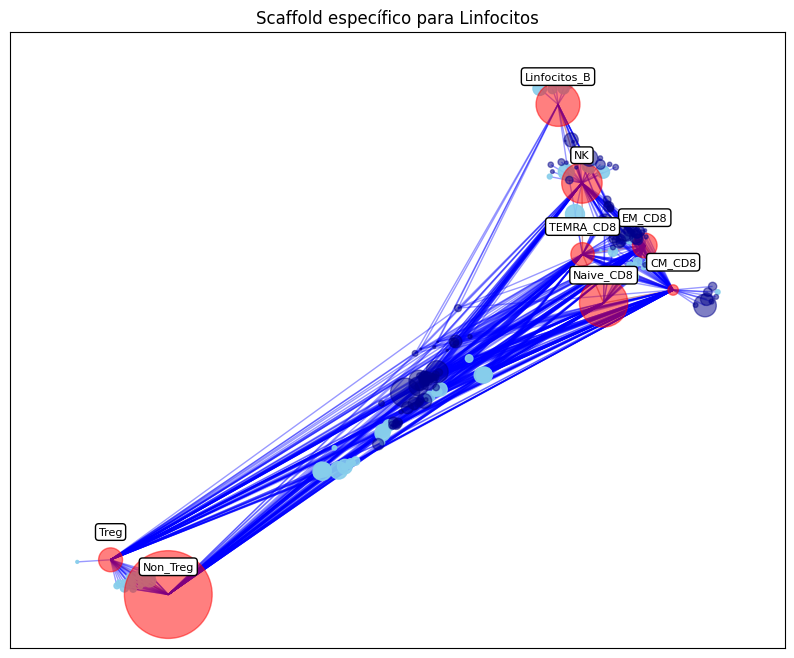

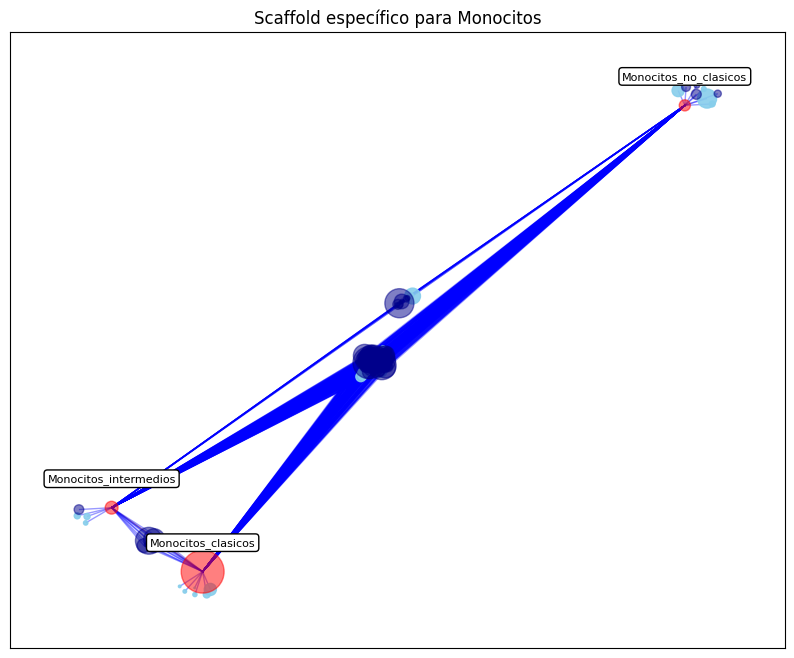

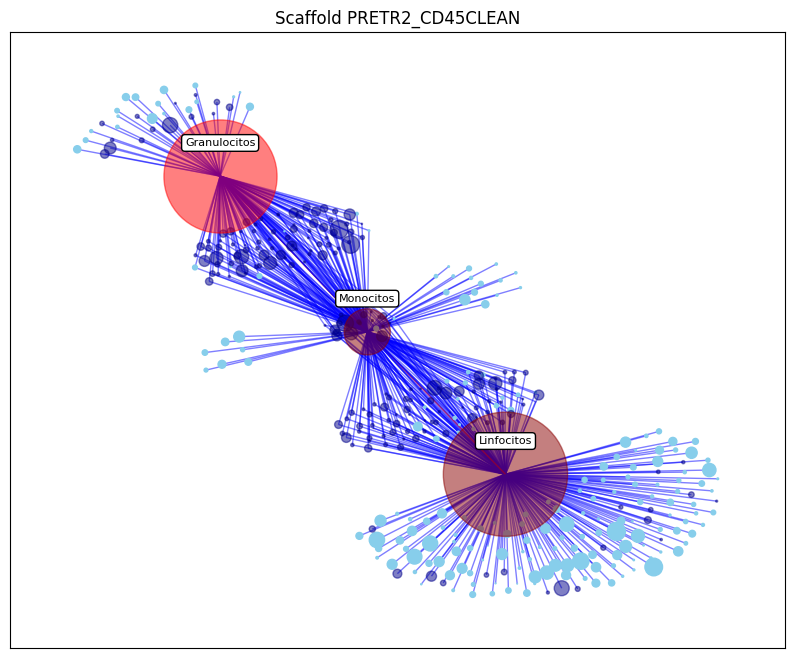

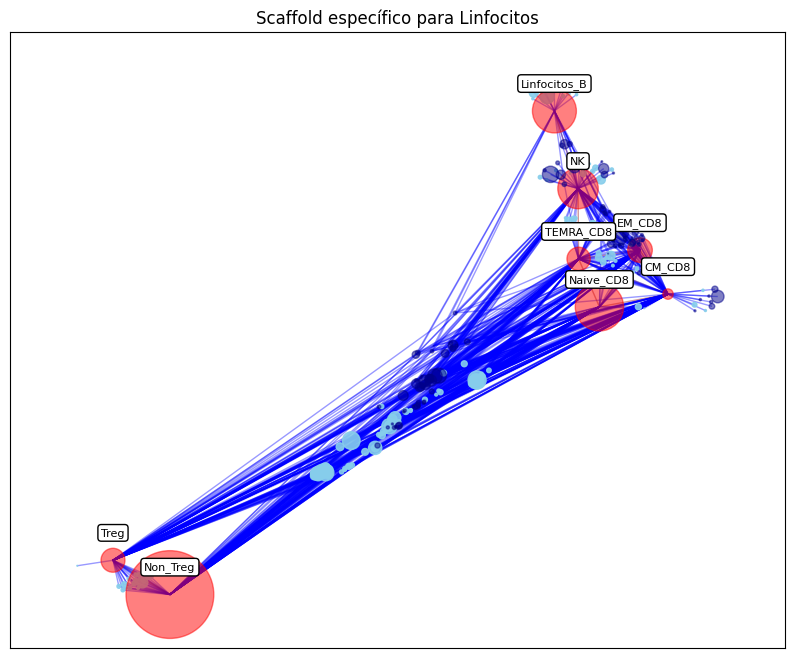

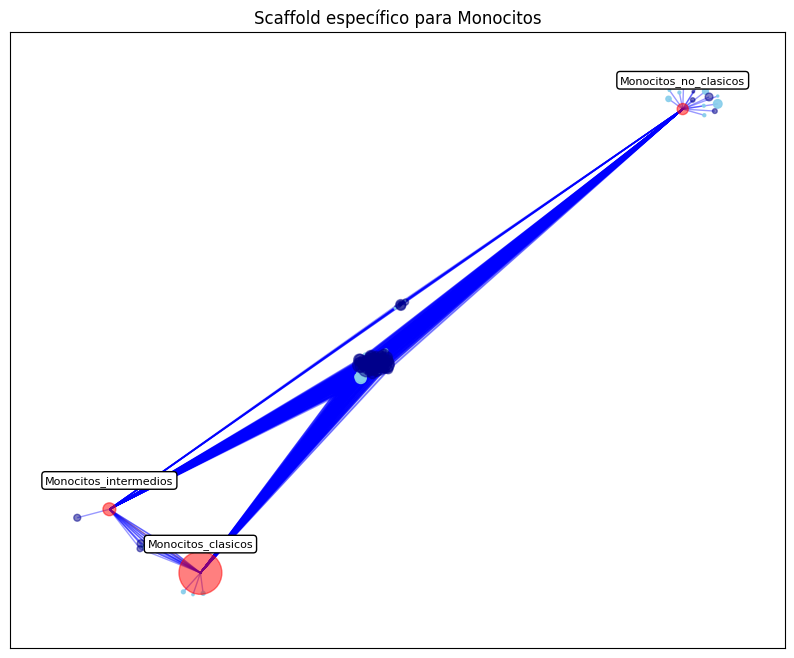

In [ ]:
# Comenzar a procesar los archivos de muestras
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    if archivo.endswith('.csv'):
        df_cluster = pd.read_csv(archivo_path)

        # Eliminar las columnas condition, batch, sample, id y label si existen
        columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
        df_cluster = df_cluster.drop(columns=[col for col in columnas_a_eliminar if col in df_cluster.columns]) 

        # Crear un nombre de variable basado en el nombre del archivo
        variable_name = os.path.splitext(archivo)[0].replace('.', '_').replace('-', '_')
        # Asignar el DataFrame a la variable dinámica
        globals()[variable_name] = df_cluster
    
        # Calcular las medianas de cada cluster en el DataFrame de clusters
        medianas_cluster = df_cluster.groupby('cluster').median()
        medianas_cluster = medianas_cluster.rename(index=lambda x: f"C_{x}")

        # Calcular las MEDIAS de cada cluster en el DataFrame de clusters
        medias_cluster = df_cluster.groupby('cluster').mean()
        medias_cluster = medias_cluster.rename(index=lambda x: f"C_{x}")

        # OBTENEMOS LAS MEDIAS DE TODOS (gating, clusters de la muestra y clusters de control)
        medias_todo = pd.concat([medias_gating, medias_cluster, medias_control], axis=0)

        # Guardamos el nombre del archivo para poder buscar los archivos .fcs correspondientes
        archivo_nombre = limpiar_nombre_variable(os.path.splitext(archivo)[0])
        if archivo_nombre.endswith('_clusters'):
            archivo_nombre = archivo_nombre[:-9]

        # Crear una lista de nombres de nodos
        nodos_gating = medias_gating.index.tolist()
        nodos_clusters = medias_cluster.index.tolist()
        nodos_clusters_control = medias_control.index.tolist()
        nodos = nodos_gating + nodos_clusters + nodos_clusters_control

        # Filtrar los DataFrames para obtener uno sin nodos hijos y otro sin nodos padre
        nodos_hijos = [nodo for subnodos in jerarquia.values() for nodo in subnodos]
        nodos_padre = list(jerarquia.keys())

        medias_sin_padre = medias_todo.drop(nodos_padre, errors='ignore')

        # Crear una matriz de similitud del coseno usando el DataFrame sin nodos padre
        valores_medios = np.vstack([medias_sin_padre.loc[nodo].values for nodo in medias_sin_padre.index])
        matriz_similitud_coseno = cosine_similarity(valores_medios)
        df_similitud_coseno = pd.DataFrame(matriz_similitud_coseno, index=medias_sin_padre.index, columns=medias_sin_padre.index)

        # Creamos el grafo ponderado
        G = nx.Graph()

        # Añadir nodos de jerarquía (solo nodos padre)
        for grupo in jerarquia.keys():
            G.add_node(grupo)  # Asegúrate de que se añaden los nodos padres

        # Crear el SCAFFOLD con los nodos de gating
        for nodo in nodos_gating:
            if nodo not in jerarquia:  # Solo añadir nodos de gating que no son padres
                G.add_node(nodo)

        # Calcular los umbrales de similitud para los nodos de gating
        submatriz_gating = matriz_similitud_coseno[:len(nodos_gating), :len(nodos_gating)]
        np.fill_diagonal(submatriz_gating, 0)  # Eliminar los valores de la diagonal principal
        umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)

        # Calcular el umbral de similitud para los nodos de clusters y gating
        submatriz_clusters_gating = matriz_similitud_coseno[len(nodos_gating):, :len(nodos_gating)]
        umbrales_clusters_gating = 0.9

        # Añadir aristas solo entre nodos similares basados en el umbral de similitud del coseno
        for i in range(len(nodos_gating)):
            for j in range(i + 1, len(nodos_gating)):
                if matriz_similitud_coseno[i, j] >= umbrales_gating[j]:
                    G.add_edge(nodos_gating[i], nodos_gating[j], weight=matriz_similitud_coseno[i, j]**4)

        # Calcular las posiciones de los nodos de gating (NO USAR k)
        pos_gating = nx.spring_layout(G, weight='weight', seed=2)
        
        # Añadimos los nodos de los clusters, sin mover los nodos de gating
        for nodo in nodos_clusters:
            G.add_node(nodo)

        # Añadimos también los nodos de los clusters de control
        for nodo in nodos_clusters_control:
            G.add_node(nodo)

        # Añadir aristas solo entre nodos de clusters (muestra) y nodos de gating
        for i in range(len(nodos_clusters)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **4)
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)

        # Añadir aristas solo entre nodos de clusters de control y nodos de gating
        for i in range(len(nodos_clusters_control)):
            for j in range(len(nodos_gating)):
                nodo_gating = nodos_gating[j]
                if nodo_gating in jerarquia:
                    # Si el nodo de gating es un nodo padre, añadir aristas basadas en los nodos hijos
                    for subnodo in jerarquia[nodo_gating]:
                        if subnodo in df_similitud_coseno.index:
                            idx_cluster = nodos.index(nodos_clusters_control[i])
                            idx_subnodo = nodos.index(subnodo)
                            if matriz_similitud_coseno[idx_cluster, idx_subnodo] >= umbrales_clusters_gating:
                                G.add_edge(nodos_clusters_control[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_subnodo] **4)
                else:
                    # Si el nodo de gating no es un nodo padre, añadir aristas directamente
                    if nodo_gating in df_similitud_coseno.index:
                        idx_cluster = nodos.index(nodos_clusters_control[i])
                        idx_gating = nodos.index(nodo_gating)
                        if matriz_similitud_coseno[idx_cluster, idx_gating] >= umbrales_clusters_gating:
                            G.add_edge(nodos_clusters_control[i], nodo_gating, weight=matriz_similitud_coseno[idx_cluster, idx_gating]**4)

        # Agrupar nodos hijos bajo nodos padres
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Añadir aristas entre el nodo padre y sus vecinos (excluyendo otros hijos)
                    for vecino in list(G.neighbors(subnodo)):
                        if vecino not in subnodos:
                            G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                    G.remove_node(subnodo)

        # Asegúrate de que los nodos padres están conectados a los nodos de clusters
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    for nodo_cluster in nodos_clusters:
                        if G.has_edge(nodo_cluster, subnodo):
                            G.add_edge(grupo, nodo_cluster, weight=G[subnodo][nodo_cluster]['weight']**2)

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
        pos = nx.spring_layout(
            G, pos=pos_gating, fixed=nodos_gating,
            weight='weight', k=0.02/np.mean(matriz_similitud_coseno), seed=1
        )

        # Asignar colores a los nodos
        color_map = []
        for nodo in G.nodes():
            if nodo in nodos_gating:
                color_map.append('red')
            elif nodo in nodos_clusters_control:
                color_map.append('darkblue')
            else:
                color_map.append('skyblue')
        
        # Asignar colores a las aristas
        edge_colors = []
        for u, v in G.edges():
            if (
                (u in nodos_gating and v in nodos_gating)
                or (u in nodos_padre and v in nodos_gating)
                or (u in nodos_gating and v in nodos_padre)
                or (u in nodos_padre and v in nodos_padre)
            ):
                edge_colors.append('red')
            else:
                edge_colors.append('blue')

        # Calcular el tamaño de los nodos en base al número de eventos que contienen
        tamanos_nodos = {}
        for nodo in G.nodes:
            if nodo in nodos_padre:
                num_eventos = sum(
                    len(globals()[limpiar_nombre_variable(hijo)])
                    for hijo in jerarquia[nodo]
                    if limpiar_nombre_variable(hijo) in globals()
                )
                tamanos_nodos[nodo] = num_eventos * 0.01
            elif nodo in nodos_gating:
                num_eventos = len(globals()[limpiar_nombre_variable(nodo)])
                tamanos_nodos[nodo] = num_eventos * 0.01
            else:
                cluster_num = int(nodo.split('_')[1])
                num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                tamanos_nodos[nodo] = num_eventos * 0.1

        # Para dibujar sólo los clusters de muestra y de control que tengan conexiones
        nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]
        nodos_clusters_control_conexos = [nodo for nodo in nodos_clusters_control if G.degree(nodo) > 0]

        # Ajustar las posiciones de las etiquetas
        pos_labels = {
            nodo: (pos[nodo][0], pos[nodo][1] + 0.05)
            for nodo in G.nodes if nodo in pos
        }

        # Dibujar el grafo
        edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

        plt.figure(figsize=(10, 8))
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_clusters_conexos,
            node_color='skyblue',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos]
        )
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_clusters_control_conexos,
            node_color='darkblue',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_control_conexos],
            alpha = 0.5
        )
        nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
        tamanos_nodos_gating = [tamanos_nodos[nodo] for nodo in nodos_gating_con_pos]
        nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]
        tamanos_nodos_padre = [tamanos_nodos[nodo] for nodo in nodos_padre_con_pos]

        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_gating_con_pos,
            node_color='red',
            node_size=tamanos_nodos_gating,
            alpha=0.5
        )
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_padre_con_pos,
            node_color='darkred',
            node_size=tamanos_nodos_padre,
            alpha=0.5
        )
        nx.draw_networkx_edges(
            G, pos, edge_color=edge_colors,
            width=1.0, alpha=0.5
        )

        # Añadir etiquetas a los nodos de gating y nodos padre
        labels = {nodo: f"{nodo}" for nodo in nodos_gating if nodo in pos}
        labels.update({nodo: f"{nodo}" for nodo in nodos_padre if nodo in pos})

        nx.draw_networkx_labels(
            G, pos_labels, labels=labels,
            font_size=8,
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
        )

        plt.title(f"Scaffold {archivo_nombre.split('-')[0]}")
        plt.show()

        # Para cada nodo padre, crear un grafo específico
        for nodo_padre in nodos_padre:
            G_especifico = nx.Graph()

            nodos_hijos = jerarquia[nodo_padre]

            # Añadir nodos de gating hijos al grafo específico
            for nodo_hijo in nodos_hijos:
                if nodo_hijo in df_similitud_coseno.index:
                    G_especifico.add_node(nodo_hijo)

            # Filtrar la matriz de similitud del coseno para los nodos hijos
            indices_hijos = [
                nodos.index(nodo_hijo) for nodo_hijo in nodos_hijos
                if nodo_hijo in nodos
            ]
            submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

            np.fill_diagonal(submatriz_similitud_hijos, 0)
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 70, axis=0)

            # Añadir aristas solo entre nodos similares basados en el umbral
            for i in range(len(nodos_hijos)):
                for j in range(i + 1, len(nodos_hijos)):
                    if submatriz_similitud_hijos[i, j] >= umbrales_hijos[j]:
                        G_especifico.add_edge(
                            nodos_hijos[i],
                            nodos_hijos[j],
                            weight=submatriz_similitud_hijos[i, j]**4
                        )

            pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1)
            for key in pos_hijos:
                pos_hijos[key] *= 1

            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in nodos_clusters:
                for nodo_hijo in nodos_hijos:
                    if (
                        nodo_hijo in df_similitud_coseno.index and
                        nodo_cluster in df_similitud_coseno.index
                    ):
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(
                                nodo_cluster,
                                nodo_hijo,
                                weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4
                            )

            # Añadir nodos de clusters de control conectados a los nodos hijos
            for nodo_cluster in nodos_clusters_control:
                for nodo_hijo in nodos_hijos:
                    if (
                        nodo_hijo in df_similitud_coseno.index and
                        nodo_cluster in df_similitud_coseno.index
                    ):
                        idx_cluster = nodos.index(nodo_cluster)
                        idx_hijo = nodos.index(nodo_hijo)
                        if matriz_similitud_coseno[idx_cluster, idx_hijo] >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(
                                nodo_cluster,
                                nodo_hijo,
                                weight=matriz_similitud_coseno[idx_cluster, idx_hijo]**4
                            )

            pos_especifico = nx.spring_layout(
                G_especifico, pos=pos_hijos, fixed=nodos_hijos,
                weight='weight',
                k=0.02/np.mean(matriz_similitud_coseno),
                seed=1
            )

            # Aumentar los pesos de las aristas entre nodos de clusters y gating
            for u, v, d in G_especifico.edges(data=True):
                if (u in nodos_clusters and v in nodos_gating) or (u in nodos_gating and v in nodos_clusters):
                    d['weight'] = d['weight'] ** 10

            # Asignar colores a los nodos
            color_map_especifico = []
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    color_map_especifico.append('darkred')
                elif nodo in nodos_clusters_control:
                    color_map_especifico.append('darkblue')
                else:
                    color_map_especifico.append('skyblue')

            # Asignar colores a las aristas
            edge_colors_especifico = []
            for u, v in G_especifico.edges():
                if u in nodos_hijos and v in nodos_hijos:
                    edge_colors_especifico.append('darkred')
                else:
                    edge_colors_especifico.append('blue')

            # Calcular el tamaño de los nodos en base al número de eventos
            tamanos_nodos_especifico = {}
            for nodo in G_especifico.nodes:
                if nodo in nodos_hijos:
                    num_eventos = len(globals()[limpiar_nombre_variable(nodo)])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.01
                elif nodo in nodos_clusters_control:
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1
                else:
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1

            # Filtramos los clusters en este subgrafo que no tengan conexiones
            nodos_clusters_conexos_especifico = [
                nodo for nodo in G_especifico.nodes if G_especifico.degree[nodo] > 0
            ]
            nodos_clusters_control_conexos_especifico = [
                nc for nc in nodos_clusters_control
                if nc in G_especifico and G_especifico.degree[nc] > 0
            ]

            # Dibujar el grafo específico
            plt.figure(figsize=(10, 8))
            # Primero clusters de muestra conectados
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=[n for n in nodos_clusters_conexos_especifico if n in nodos_clusters],
                node_color='skyblue',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_clusters_conexos_especifico if nodo in nodos_clusters],
                alpha=0.9
            )
            # Nodos gating hijos
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_hijos,
                node_color='red',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos],
                alpha=0.5
            )
            # Clusters de control conectados
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_clusters_control_conexos_especifico,
                node_color='darkblue',
                node_size=[tamanos_nodos_especifico[nc] for nc in nodos_clusters_control_conexos_especifico],
                alpha=0.5
            )
            nx.draw_networkx_edges(
                G_especifico, pos_especifico,
                edge_color=edge_colors_especifico,
                width=1.0,
                alpha=0.4
            )

            pos_labels = {
                nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0.1)
                for nodo in G_especifico.nodes if nodo in pos_especifico
            }
            labels_especifico = {
                nodo: f"{nodo}"
                for nodo in nodos_hijos if nodo in pos_especifico
            }

            nx.draw_networkx_labels(
                G_especifico, pos_labels,
                labels=labels_especifico,
                font_size=8,
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
            )

            plt.title(f"Scaffold específico para {nodo_padre.split('-')[0]}")
            plt.show()

        print('\n \n \n \n')

### Tamaño de nodos de gating en base a clusters de controles

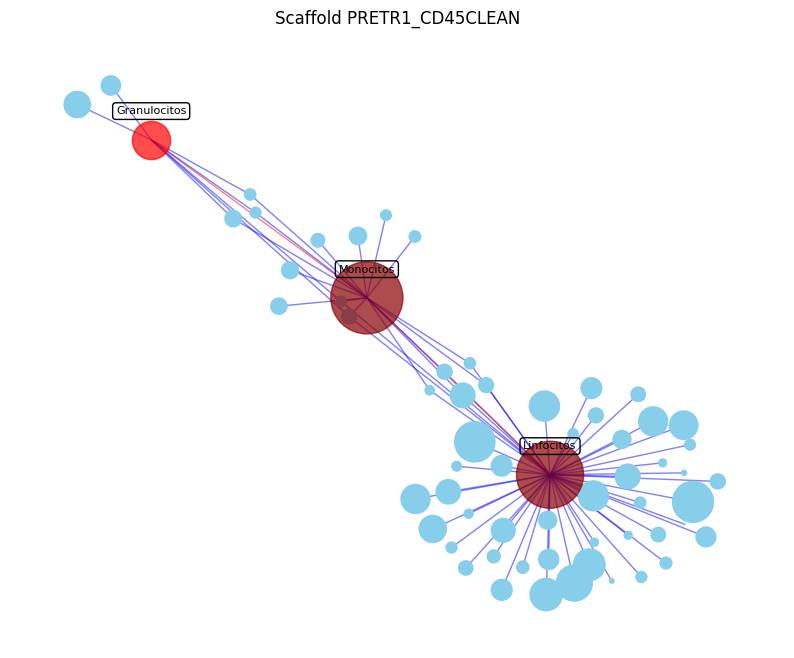

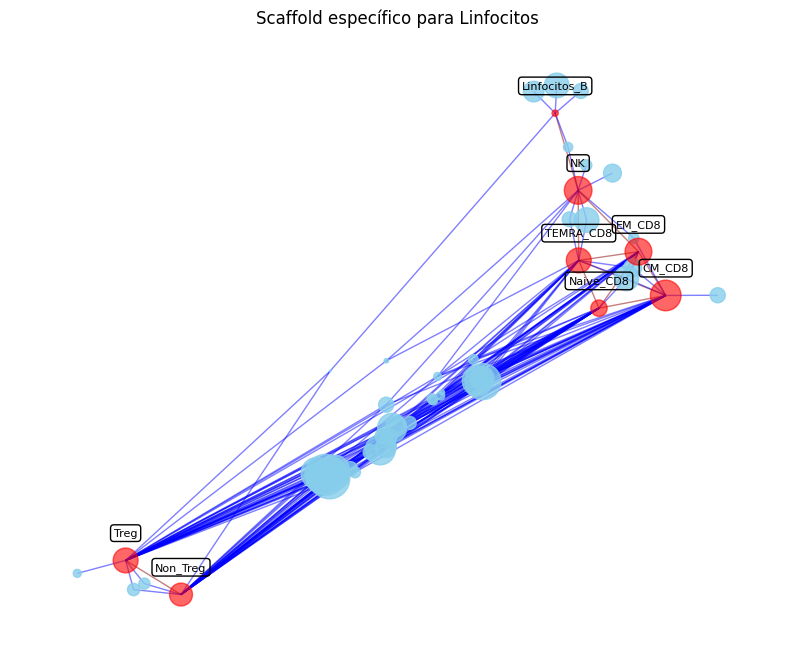

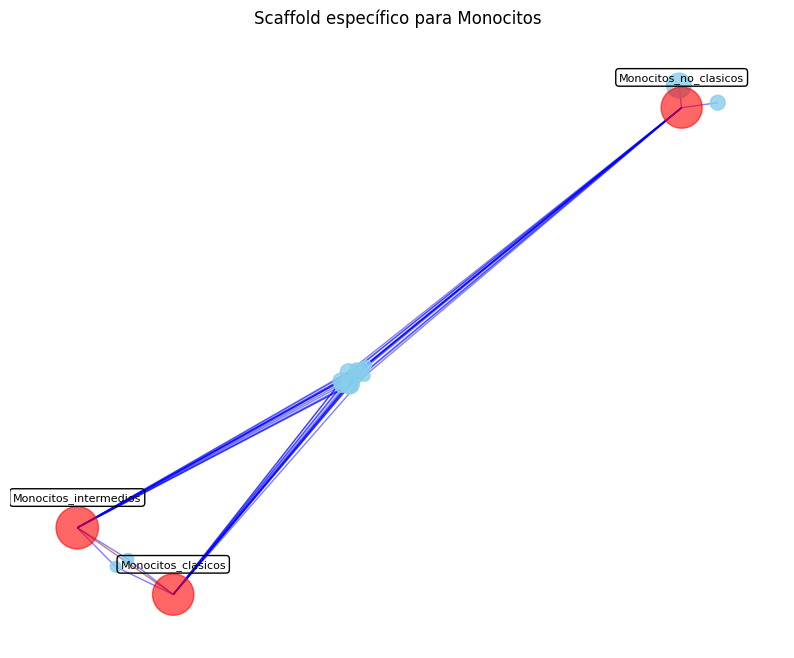

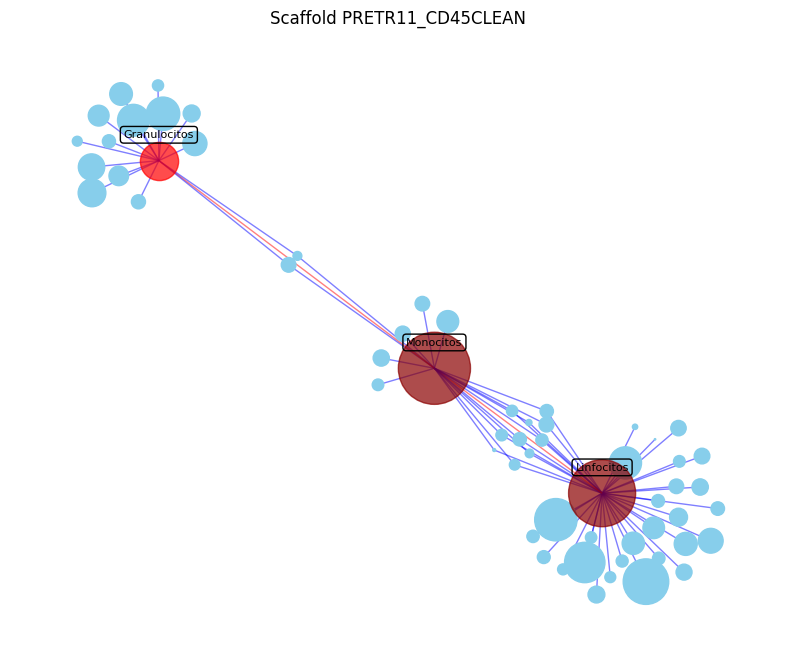

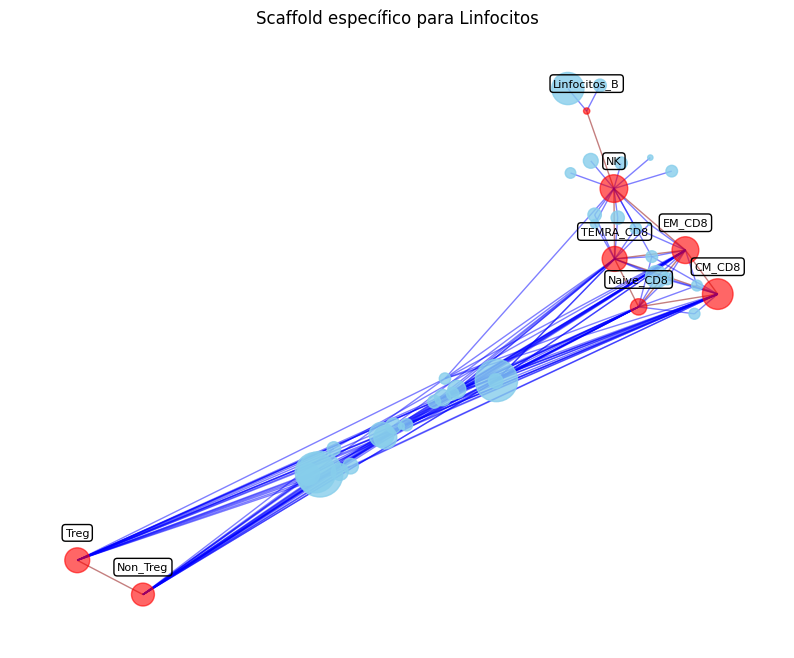

...

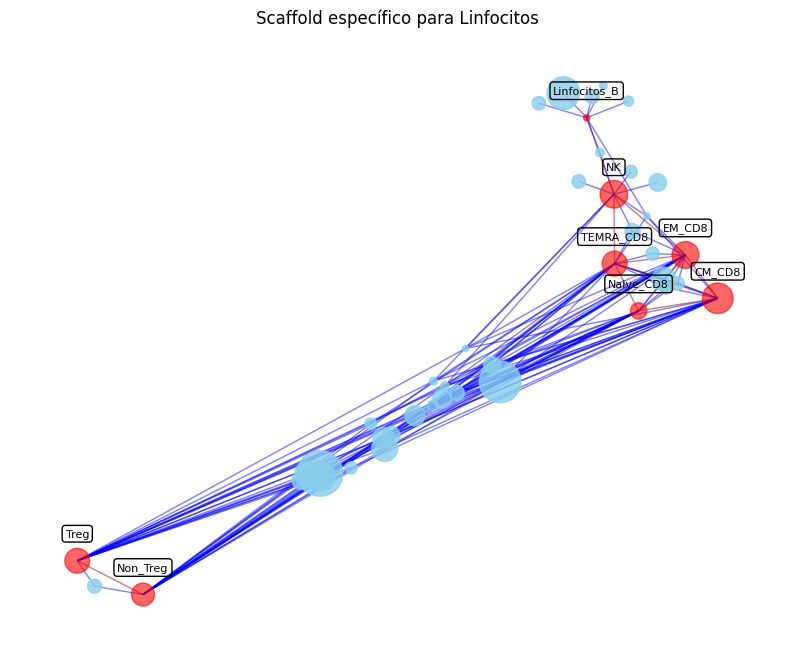

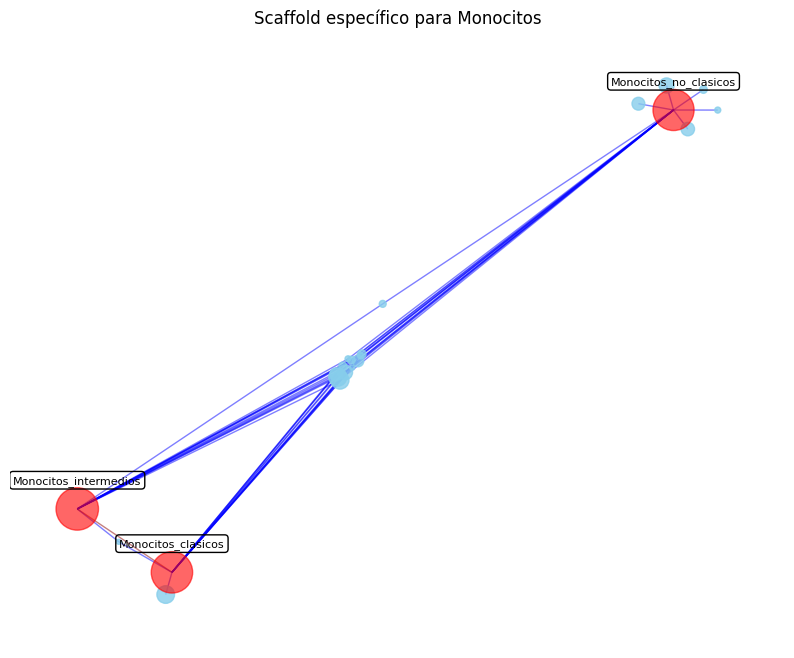

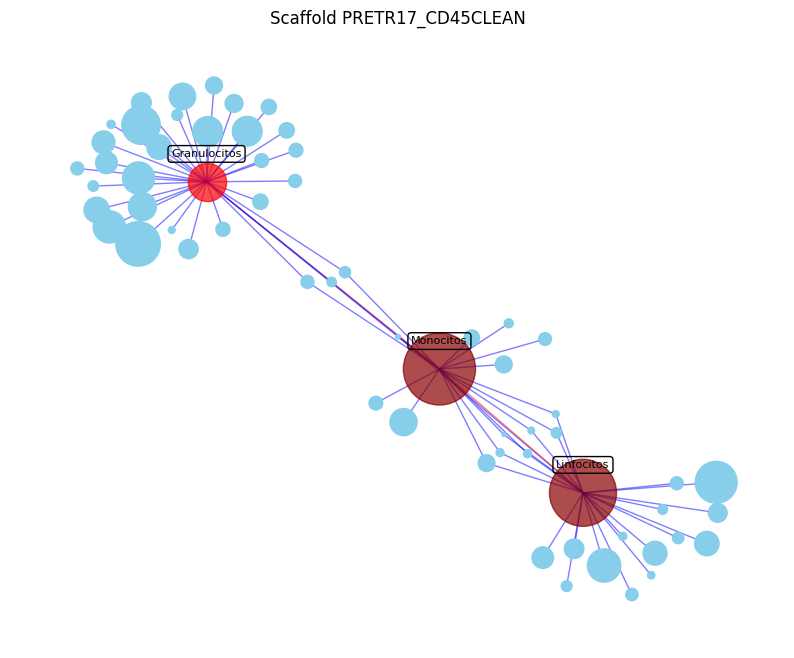

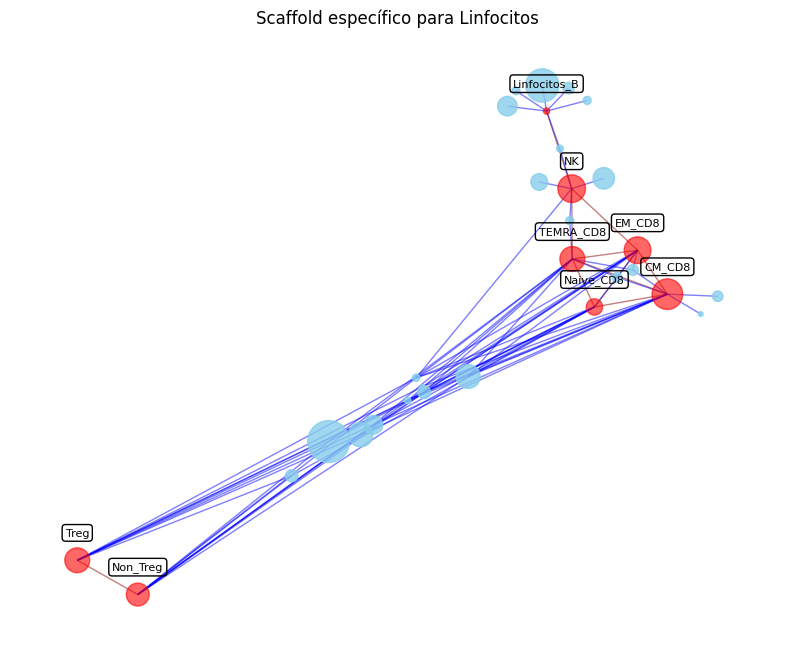

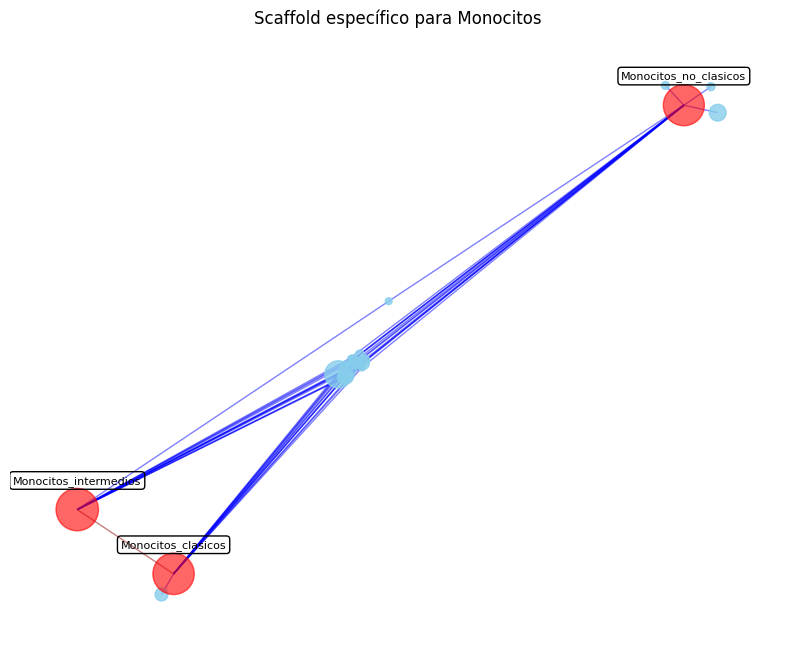

In [ ]:
# Comenzar a procesar los archivos de muestras
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    if archivo.endswith('.csv'):
        df_cluster = pd.read_csv(archivo_path)

        # Eliminar las columnas no necesarias
        columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
        df_cluster = df_cluster.drop(columns=[col for col in columnas_a_eliminar if col in df_cluster.columns]) 

        # Crear un nombre de variable basado en el nombre del archivo
        variable_name = limpiar_nombre_variable(os.path.splitext(archivo)[0])
        # Asignar el DataFrame a la variable dinámica
        globals()[variable_name] = df_cluster

        # Calcular las medias de cada cluster en el DataFrame de clusters
        medias_cluster = df_cluster.groupby('cluster').mean()
        medias_cluster = medias_cluster.rename(index=lambda x: f"C_{x}")

        # Combinar las medias de gating, clusters de muestra y clusters de control
        medias_todo = pd.concat([medias_gating, medias_cluster, medias_control], axis=0)

        # Guardamos el nombre del archivo para utilizarlo posteriormente
        archivo_nombre = limpiar_nombre_variable(os.path.splitext(archivo)[0])
        if archivo_nombre.endswith('_clusters'):
            archivo_nombre = archivo_nombre[:-9]

        # Crear una lista de nombres de nodos
        nodos_gating = medias_gating.index.tolist()
        nodos_clusters = medias_cluster.index.tolist()
        nodos_clusters_control = medias_control.index.tolist()
        nodos = nodos_gating + nodos_clusters + nodos_clusters_control

        # Filtrar los DataFrames para obtener uno sin nodos padre
        nodos_padre = list(jerarquia.keys())
        medias_sin_padre = medias_todo.drop(nodos_padre, errors='ignore')

        # Crear una matriz de similitud del coseno usando el DataFrame sin nodos padre
        valores_medios = np.vstack([medias_sin_padre.loc[nodo].values for nodo in medias_sin_padre.index])
        matriz_similitud_coseno = cosine_similarity(valores_medios)
        df_similitud_coseno = pd.DataFrame(
            matriz_similitud_coseno,
            index=medias_sin_padre.index,
            columns=medias_sin_padre.index
        )

        # Crear el grafo ponderado
        G = nx.Graph()

        # Añadir nodos de jerarquía (solo nodos padre)
        for grupo in jerarquia.keys():
            G.add_node(grupo)

        # Añadir nodos de gating que no son padres
        for nodo in nodos_gating:
            if nodo not in jerarquia:
                G.add_node(nodo)

        # Calcular los umbrales de similitud para los nodos de gating
        indices_nodos_gating = [i for i, nodo in enumerate(medias_sin_padre.index) if nodo in nodos_gating]
        submatriz_gating = matriz_similitud_coseno[np.ix_(indices_nodos_gating, indices_nodos_gating)]
        np.fill_diagonal(submatriz_gating, 0)
        umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)

        # Calcular el umbral de similitud para los nodos de clusters y gating
        umbrales_clusters_gating = 0.9

        # Añadir aristas entre nodos de gating basados en la similitud
        for i in range(len(nodos_gating)):
            for j in range(i + 1, len(nodos_gating)):
                idx_i = medias_sin_padre.index.get_loc(nodos_gating[i])
                idx_j = medias_sin_padre.index.get_loc(nodos_gating[j])
                if matriz_similitud_coseno[idx_i, idx_j] >= umbrales_gating[j]:
                    G.add_edge(
                        nodos_gating[i],
                        nodos_gating[j],
                        weight=matriz_similitud_coseno[idx_i, idx_j]**4
                    )

        # Calcular las posiciones de los nodos de gating
        pos_gating = nx.spring_layout(G, weight='weight', seed=2)

        # Añadir nodos de clusters al grafo
        for nodo in nodos_clusters:
            G.add_node(nodo)

        # Añadir aristas entre nodos de clusters y nodos de gating
        for nodo_cluster in nodos_clusters:
            for nodo_gating in nodos_gating:
                idx_cluster = medias_sin_padre.index.get_loc(nodo_cluster)
                idx_gating = medias_sin_padre.index.get_loc(nodo_gating)
                similitud = matriz_similitud_coseno[idx_cluster, idx_gating]
                if similitud >= umbrales_clusters_gating:
                    G.add_edge(
                        nodo_cluster,
                        nodo_gating,
                        weight=similitud**4
                    )

        # Agrupar nodos hijos bajo nodos padres
        for grupo, subnodos in jerarquia.items():
            for subnodo in subnodos:
                if subnodo in G:
                    # Añadir aristas entre el nodo padre y sus vecinos
                    for vecino in list(G.neighbors(subnodo)):
                        if vecino not in subnodos:
                            G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                    G.remove_node(subnodo)

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
        pos = nx.spring_layout(
            G,
            pos=pos_gating,
            fixed=nodos_gating,
            weight='weight',
            k=0.05,  # Disminuir k para acercar los nodos
            seed=1
        )

        # Asignar colores a los nodos
        color_map = []
        for nodo in G.nodes():
            if nodo in nodos_gating:
                color_map.append('red')
            elif nodo in nodos_padre:
                color_map.append('darkred')
            else:
                color_map.append('skyblue')

        # Asignar colores a las aristas
        edge_colors = []
        for u, v in G.edges():
            if (u in nodos_gating and v in nodos_gating) or \
               (u in nodos_padre and v in nodos_gating) or \
               (u in nodos_gating and v in nodos_padre) or \
               (u in nodos_padre and v in nodos_padre):
                edge_colors.append('red')
            else:
                edge_colors.append('blue')

        # Calcular el tamaño de los nodos basándose en los datos de los controles
        tamanos_nodos = {}
        # Tamaños para nodos de gating
        for nodo in nodos_gating:
            clusters_asociados_control = []
            for nodo_control in nodos_clusters_control:
                idx_nodo = medias_sin_padre.index.get_loc(nodo)
                idx_control = medias_sin_padre.index.get_loc(nodo_control)
                similitud = matriz_similitud_coseno[idx_control, idx_nodo]
                if similitud >= umbrales_clusters_gating:
                    clusters_asociados_control.append(int(nodo_control.split('_')[1]))
            if clusters_asociados_control:
                num_eventos = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
                size = (num_eventos / len(archivos_controles)) * 0.01
            else:
                size = 0.01
            tamanos_nodos[nodo] = size

        # Tamaños para nodos padres
        for nodo in nodos_padre:
            num_eventos = 0
            for hijo in jerarquia[nodo]:
                if hijo in tamanos_nodos:
                    num_eventos += tamanos_nodos[hijo]
            tamanos_nodos[nodo] = num_eventos

        # Tamaños para nodos de clusters
        for nodo in nodos_clusters:
            cluster_num = int(nodo.split('_')[1])
            num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
            tamanos_nodos[nodo] = num_eventos * 0.1  # Ajustar el factor según sea necesario

        nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]

        # Ajustar las posiciones de las etiquetas
        pos_labels = {nodo: (pos[nodo][0], pos[nodo][1] + 0.05) for nodo in G.nodes if nodo in pos}

        # Dibujar el grafo
        edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

        plt.figure(figsize=(10, 8))
        # Dibujar los nodos de clusters primero
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_clusters_conexos,
            node_color='skyblue',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos]
        )
        # Dibujar los nodos de gating y padres
        nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
        nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_gating_con_pos,
            node_color='red',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_gating_con_pos],
            alpha=0.7
        )
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=nodos_padre_con_pos,
            node_color='darkred',
            node_size=[tamanos_nodos[nodo] for nodo in nodos_padre_con_pos],
            alpha=0.7
        )
        nx.draw_networkx_edges(
            G, pos,
            edge_color=edge_colors,
            width=1.0,
            alpha=0.5
        )

        # Añadir etiquetas a los nodos de gating y padres
        labels = {nodo: f"{nodo}" for nodo in nodos_gating_con_pos + nodos_padre_con_pos}
        nx.draw_networkx_labels(
            G, pos_labels,
            labels=labels,
            font_size=8,
            bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.3')
        )

        plt.title(f"Scaffold {archivo_nombre.split('-')[0]}")
        plt.axis('off')
        plt.show()

        # **Generar grafos específicos para cada nodo padre**
        for nodo_padre in nodos_padre:
            # Crear un nuevo grafo específico para el nodo padre
            G_especifico = nx.Graph()

            # Obtener los nodos hijos del nodo padre
            nodos_hijos = jerarquia[nodo_padre]

            # Añadir nodos de gating hijos al grafo específico
            for nodo_hijo in nodos_hijos:
                if nodo_hijo in medias_sin_padre.index:
                    G_especifico.add_node(nodo_hijo)

            # Filtrar la matriz de similitud del coseno para los nodos hijos
            indices_hijos = [medias_sin_padre.index.get_loc(nodo_hijo) for nodo_hijo in nodos_hijos if nodo_hijo in medias_sin_padre.index]
            submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

            # Calcular los umbrales de similitud para los nodos de gating hijos
            np.fill_diagonal(submatriz_similitud_hijos, 0)  # Eliminar los valores de la diagonal principal
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 70, axis=0)

            # Añadir aristas entre nodos hijos basados en la similitud
            for i in range(len(nodos_hijos)):
                for j in range(i + 1, len(nodos_hijos)):
                    if submatriz_similitud_hijos[i, j] >= umbrales_hijos[j]:
                        G_especifico.add_edge(
                            nodos_hijos[i],
                            nodos_hijos[j],
                            weight=submatriz_similitud_hijos[i, j]**4
                        )

            # Calcular las posiciones de los nodos de gating hijos
            pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1)

            # Añadir nodos de clusters conectados a los nodos hijos
            for nodo_cluster in nodos_clusters:
                for nodo_hijo in nodos_hijos:
                    if nodo_hijo in medias_sin_padre.index and nodo_cluster in medias_sin_padre.index:
                        idx_cluster = medias_sin_padre.index.get_loc(nodo_cluster)
                        idx_hijo = medias_sin_padre.index.get_loc(nodo_hijo)
                        similitud = matriz_similitud_coseno[idx_cluster, idx_hijo]
                        if similitud >= umbrales_clusters_gating:
                            G_especifico.add_node(nodo_cluster)
                            G_especifico.add_edge(
                                nodo_cluster,
                                nodo_hijo,
                                weight=similitud**4
                            )

            # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos hijos
            pos_especifico = nx.spring_layout(
                G_especifico,
                pos=pos_hijos, 
                fixed=nodos_hijos,
                weight='weight',
                k=0.05,  # Ajustar k según sea necesario
                seed=1
            )

            # Asignar colores a los nodos
            color_map_especifico = []
            for nodo in G_especifico.nodes():
                if nodo in nodos_hijos:
                    color_map_especifico.append('darkred')
                else:
                    color_map_especifico.append('skyblue')

            # Asignar colores a las aristas
            edge_colors_especifico = []
            for u, v in G_especifico.edges():
                if u in nodos_hijos and v in nodos_hijos:
                    edge_colors_especifico.append('darkred')
                else:
                    edge_colors_especifico.append('blue')

            # Calcular el tamaño de los nodos en base al número de eventos que contienen
            tamanos_nodos_especifico = {}
            for nodo in G_especifico.nodes():
                if nodo in nodos_hijos:
                    clusters_asociados_control = []
                    idx_nodo = medias_sin_padre.index.get_loc(nodo)
                    for nodo_control in nodos_clusters_control:
                        idx_control = medias_sin_padre.index.get_loc(nodo_control)
                        similitud = matriz_similitud_coseno[idx_control, idx_nodo]
                        if similitud >= umbrales_clusters_gating:
                            clusters_asociados_control.append(int(nodo_control.split('_')[1]))
                    if clusters_asociados_control:
                        num_eventos = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
                        size = (num_eventos / len(archivos_controles)) * 0.01
                    else:
                        size = 0.01
                    tamanos_nodos_especifico[nodo] = size
                else:
                    cluster_num = int(nodo.split('_')[1])
                    num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                    tamanos_nodos_especifico[nodo] = num_eventos * 0.1  # Ajustar el factor según sea necesario

            # Ajustar las posiciones de las etiquetas
            pos_labels_especifico = {nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0.1) for nodo in G_especifico.nodes() if nodo in pos_especifico}

            # Dibujar el grafo específico
            plt.figure(figsize=(10, 8))
            nodos_clusters_conexos_especifico = [nodo for nodo in G_especifico.nodes() if G_especifico.degree[nodo] > 0 and nodo in nodos_clusters]
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_clusters_conexos_especifico,
                node_color='skyblue',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_clusters_conexos_especifico],
                alpha=0.8
            )
            nx.draw_networkx_nodes(
                G_especifico, pos_especifico,
                nodelist=nodos_hijos,
                node_color='red',
                node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos],
                alpha=0.6
            )
            nx.draw_networkx_edges(
                G_especifico, pos_especifico,
                edge_color=edge_colors_especifico,
                width=1.0,
                alpha=0.5
            )

            # Añadir etiquetas a los nodos hijos
            labels_especifico = {nodo: f"{nodo}" for nodo in nodos_hijos}
            nx.draw_networkx_labels(
                G_especifico, pos_labels_especifico,
                labels=labels_especifico,
                font_size=8,
                bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.3')
            )

            plt.title(f"Scaffold específico para {nodo_padre}")
            plt.axis('off')
            plt.show()

Diferencias entre controles y casos representadas por colores

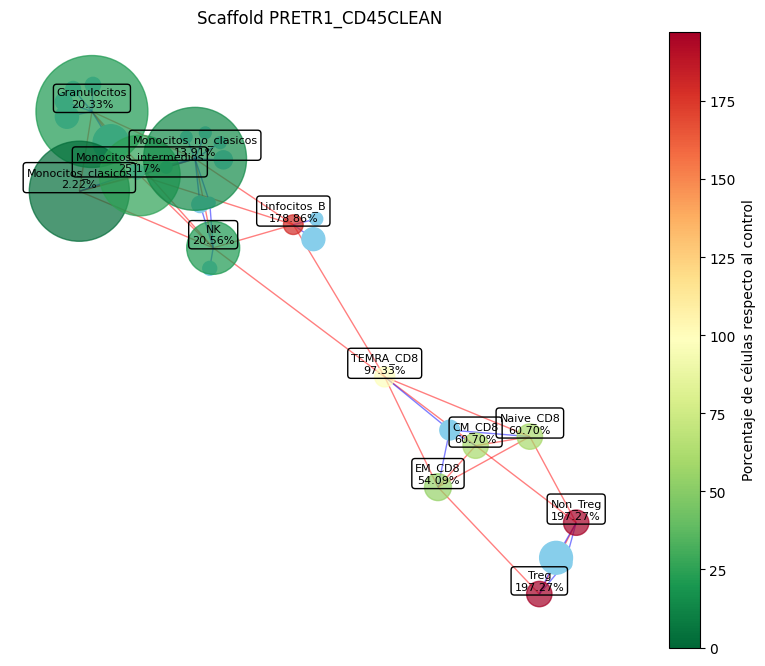

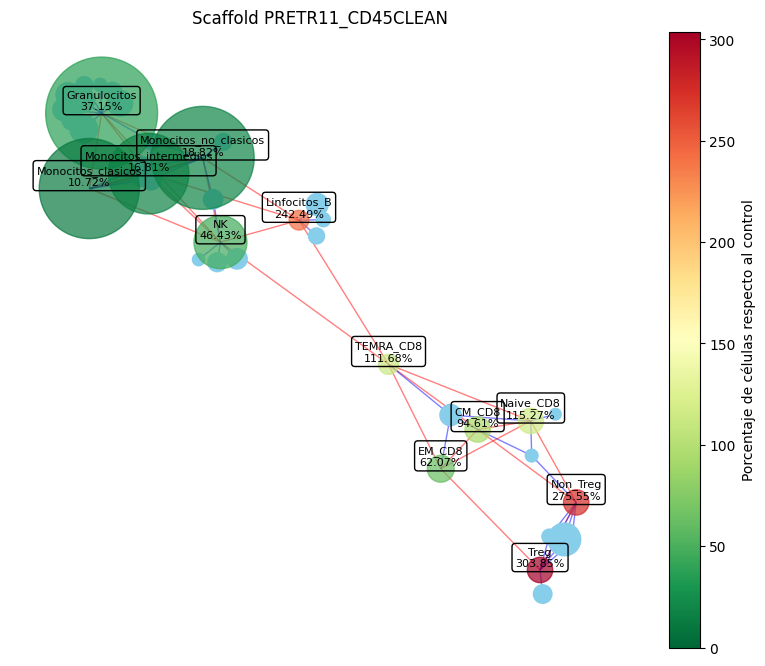

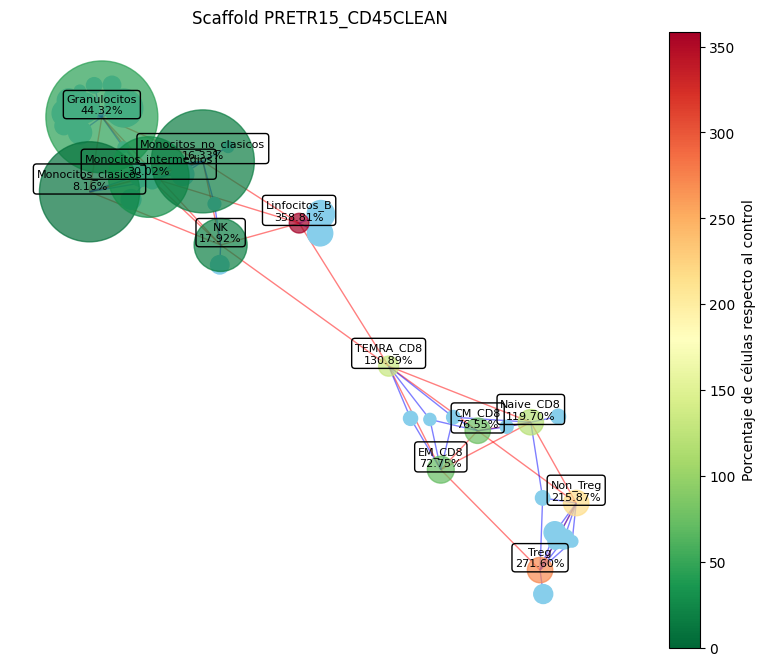

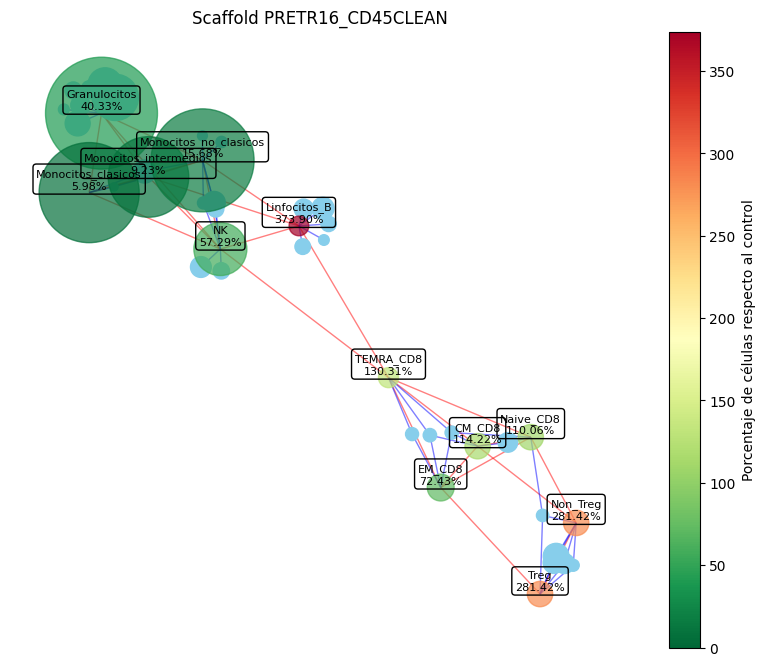

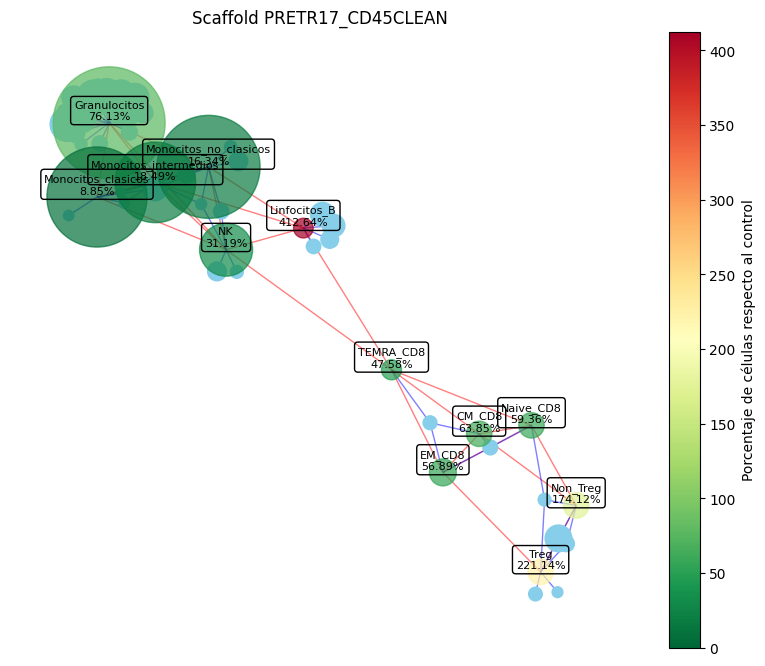

...

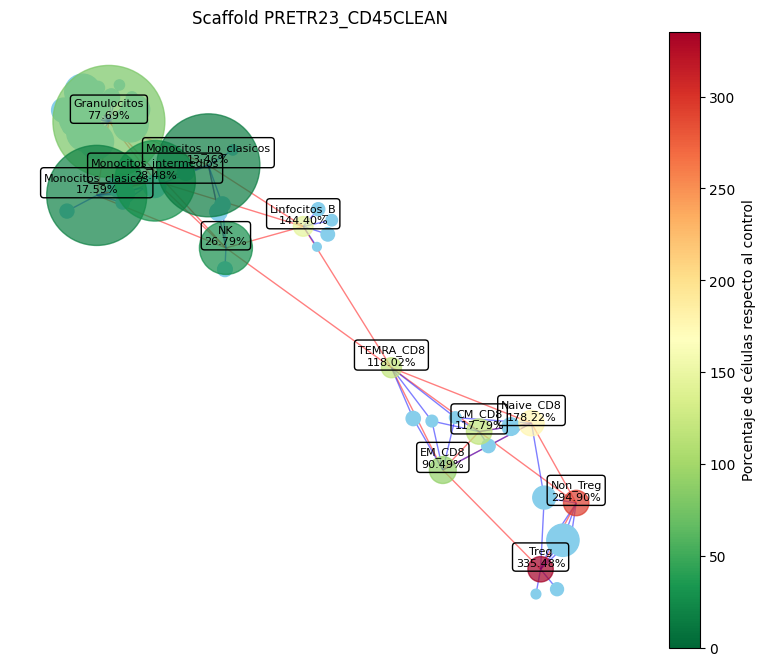

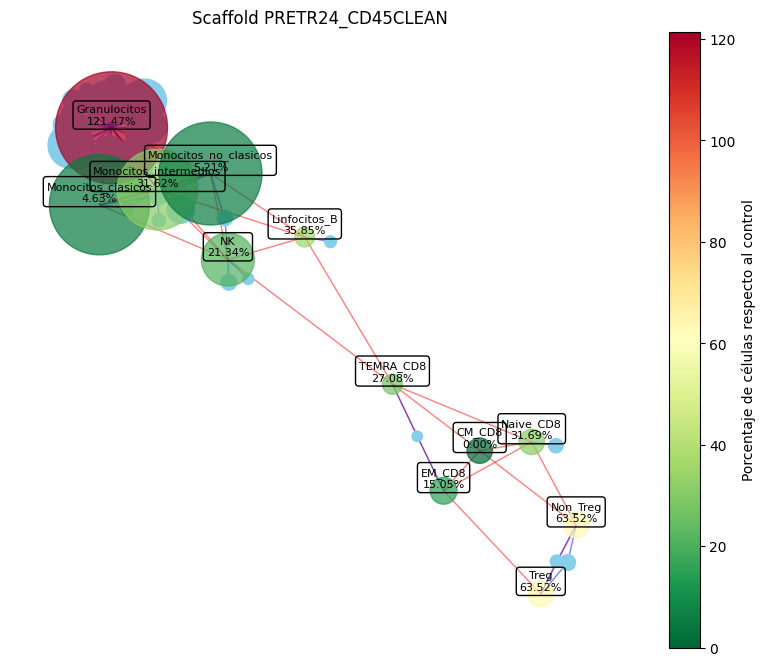

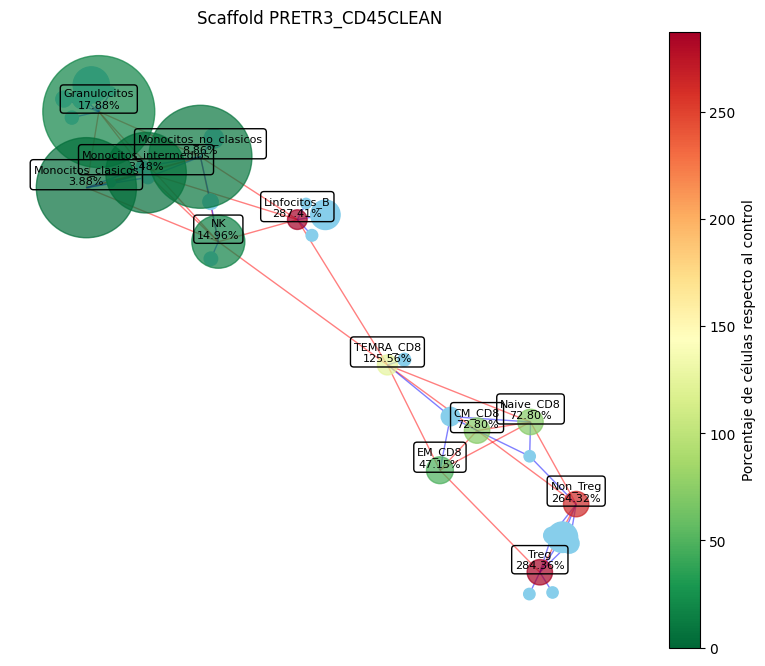

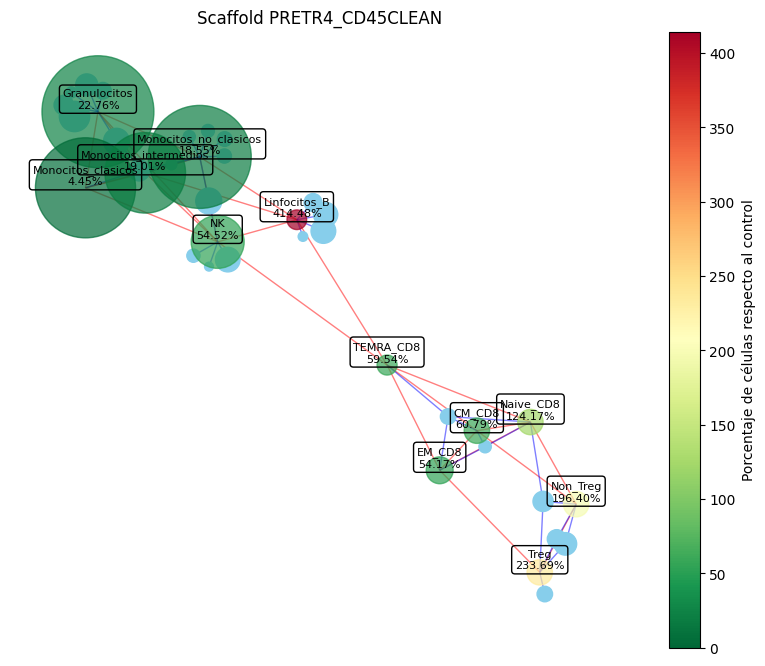

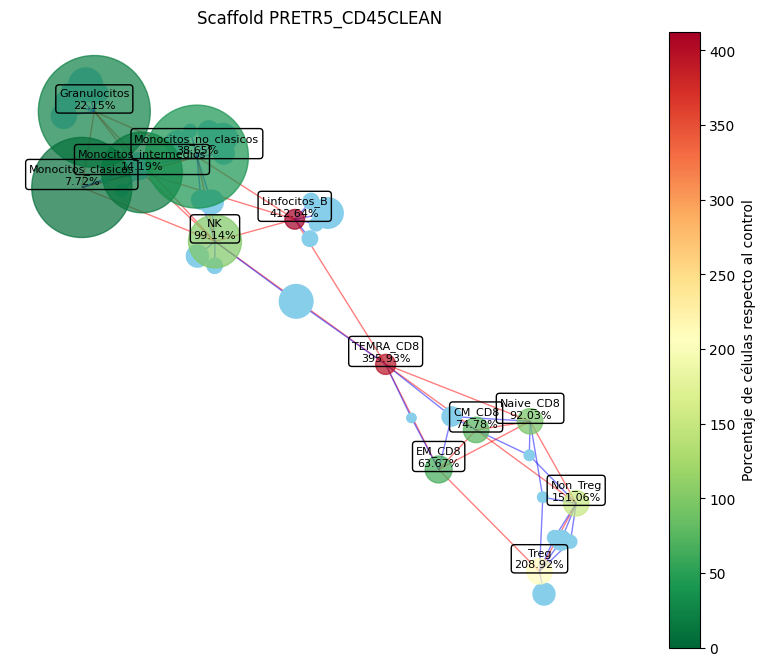

In [22]:
import numpy.ma as ma
# Comenzar a procesar los archivos de muestras
for archivo in archivos:
    archivo_path = os.path.join(dir_clusters, archivo)
    df_cluster = pd.read_csv(archivo_path)

    # Eliminar las columnas no necesarias
    columnas_a_eliminar = ['condition', 'batch', 'sample', 'id', 'label']
    df_cluster = df_cluster.drop(columns=[col for col in columnas_a_eliminar if col in df_cluster.columns]) 

    # Crear un nombre de variable basado en el nombre del archivo
    variable_name = limpiar_nombre_variable(os.path.splitext(archivo)[0])
    # Asignar el DataFrame a la variable dinámica
    globals()[variable_name] = df_cluster

    # Calcular las medias de cada cluster en el DataFrame de clusters
    medias_cluster = df_cluster.groupby('cluster').mean()
    medias_cluster = medias_cluster.rename(index=lambda x: f"C_{x}")

    # Combinar las medias de gating, clusters de muestra y clusters de control
    medias_todo = pd.concat([medias_gating, medias_cluster, medias_control], axis=0)

    # Guardamos el nombre del archivo para utilizarlo posteriormente
    archivo_nombre = limpiar_nombre_variable(os.path.splitext(archivo)[0])
    if archivo_nombre.endswith('_clusters'):
        archivo_nombre = archivo_nombre[:-9]

    # Crear una lista de nombres de nodos
    nodos_gating = medias_gating.index.tolist()
    nodos_clusters = medias_cluster.index.tolist()
    nodos_clusters_control = medias_control.index.tolist()
    nodos = nodos_gating + nodos_clusters + nodos_clusters_control

    # Filtrar los DataFrames para obtener uno sin nodos padre
    nodos_padre = list(jerarquia.keys())
    medias_sin_padre = medias_todo.drop(nodos_padre, errors='ignore')

    # Crear una matriz de similitud del coseno usando el DataFrame sin nodos padre
    valores_medios = np.vstack([medias_sin_padre.loc[nodo].values for nodo in medias_sin_padre.index])
    matriz_similitud_coseno = cosine_similarity(valores_medios)
    df_similitud_coseno = pd.DataFrame(
        matriz_similitud_coseno,
        index=medias_sin_padre.index,
        columns=medias_sin_padre.index
    )

    # Crear el grafo ponderado
    G = nx.Graph()

    # Añadir nodos de jerarquía (solo nodos padre)
    for grupo in jerarquia.keys():
        G.add_node(grupo)

    # Añadir nodos de gating que no son padres
    for nodo in nodos_gating:
        if nodo not in jerarquia:
            G.add_node(nodo)

    # Calcular los umbrales de similitud para los nodos de gating
    indices_nodos_gating = [i for i, nodo in enumerate(medias_sin_padre.index) if nodo in nodos_gating]
    submatriz_gating = matriz_similitud_coseno[np.ix_(indices_nodos_gating, indices_nodos_gating)]
    np.fill_diagonal(submatriz_gating, 0)
    umbrales_gating = np.percentile(submatriz_gating, 65, axis=0)

    # Calcular el umbral de similitud para los nodos de clusters y gating
    umbrales_clusters_gating = 0.9

    # Añadir aristas entre nodos de gating basados en la similitud
    for i in range(len(nodos_gating)):
        for j in range(i + 1, len(nodos_gating)):
            idx_i = medias_sin_padre.index.get_loc(nodos_gating[i])
            idx_j = medias_sin_padre.index.get_loc(nodos_gating[j])
            if matriz_similitud_coseno[idx_i, idx_j] >= umbrales_gating[min(i, j)]:
                G.add_edge(
                    nodos_gating[i],
                    nodos_gating[j],
                    weight=matriz_similitud_coseno[idx_i, idx_j]**4
                )

    # Calcular las posiciones de los nodos de gating
    pos_gating = nx.spring_layout(G, weight='weight', k = 0.1, seed=2)

    # Añadir nodos de clusters al grafo
    for nodo in nodos_clusters:
        G.add_node(nodo)

    # Añadir aristas entre nodos de clusters y nodos de gating
    for nodo_cluster in nodos_clusters:
        for nodo_gating in nodos_gating:
            idx_cluster = medias_sin_padre.index.get_loc(nodo_cluster)
            idx_gating = medias_sin_padre.index.get_loc(nodo_gating)
            similitud = matriz_similitud_coseno[idx_cluster, idx_gating]
            if similitud >= umbrales_clusters_gating:
                G.add_edge(
                    nodo_cluster,
                    nodo_gating,
                    weight=similitud**4
                )

    # Agrupar nodos hijos bajo nodos padres
    for grupo, subnodos in jerarquia.items():
        for subnodo in subnodos:
            if subnodo in G:
                # Añadir aristas entre el nodo padre y los clusters conectados al hijo
                for vecino in list(G.neighbors(subnodo)):
                    if vecino not in subnodos:
                        G.add_edge(grupo, vecino, weight=G[subnodo][vecino]['weight'])
                G.remove_node(subnodo)

    # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos de gating
    pos = nx.spring_layout(
        G,
        pos=pos_gating,
        fixed=nodos_gating,
        weight='weight',
        k=0.05,  # Disminuir k para acercar los nodos
        seed=1
    )

    # Asignar colores a las aristas
    edge_colors = []
    for u, v in G.edges():
        if (u in nodos_gating and v in nodos_gating) or \
           (u in nodos_padre and v in nodos_gating) or \
           (u in nodos_gating and v in nodos_padre) or \
           (u in nodos_padre and v in nodos_padre):
            edge_colors.append('red')
        else:
            edge_colors.append('blue')

    # Calcular el porcentaje de células respecto a los controles, dividiendo el total de controles entre 10
    porcentajes_celulas = {}

    # Calcular los porcentajes para nodos de gating
    for nodo_gating in nodos_gating:
        # Clusters asociados en la muestra
        nodos_asociados_muestra = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_gating)]
        celulas_asociadas_muestra = sum(
            len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados_muestra
        )

        # Clusters asociados en el control
        clusters_asociados_control = []
        idx_nodo = medias_sin_padre.index.get_loc(nodo_gating)
        for nodo_control in nodos_clusters_control:
            idx_control = medias_sin_padre.index.get_loc(nodo_control)
            similitud = matriz_similitud_coseno[idx_control, idx_nodo]
            if similitud >= umbrales_clusters_gating:
                clusters_asociados_control.append(int(nodo_control.split('_')[1]))

        celulas_asociadas_control = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
        celulas_asociadas_control /= len(archivos_controles)  # Dividir entre 10 controles

        # Calcular el porcentaje
        if celulas_asociadas_control > 0:
            porcentaje = (celulas_asociadas_muestra / celulas_asociadas_control) * 100
        else:
            porcentaje = np.nan  # Indicar que no se puede calcular
        porcentajes_celulas[nodo_gating] = porcentaje

    # Calcular los porcentajes para nodos padres
    for nodo_padre in nodos_padre:
        # Clusters asociados en la muestra
        nodos_asociados_muestra = [nodo for nodo in nodos_clusters if G.has_edge(nodo, nodo_padre)]
        celulas_asociadas_muestra = sum(
            len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados_muestra
        )

        # Clusters asociados en los controles
        clusters_asociados_control = []
        idx_nodo = medias_sin_padre.index.get_loc(nodo_padre)
        for nodo_control in nodos_clusters_control:
            idx_control = medias_sin_padre.index.get_loc(nodo_control)
            similitud = matriz_similitud_coseno[idx_control, idx_nodo]
            if similitud >= umbrales_clusters_gating:
                clusters_asociados_control.append(int(nodo_control.split('_')[1]))
        celulas_asociadas_control = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
        celulas_asociadas_control /= len(archivos_controles)  # Dividir entre 10 controles

        # Calcular el porcentaje
        if celulas_asociadas_control > 0:
            porcentaje_total = (celulas_asociadas_muestra / celulas_asociadas_control) * 100
        else:
            porcentaje_total = np.nan  # Indicar que no se puede calcular
        porcentajes_celulas[nodo_padre] = porcentaje_total

    # Calcular el tamaño de los nodos basándose en los datos de los controles
    tamanos_nodos = {}

    # Tamaños para nodos de gating
    for nodo in nodos_gating:
        clusters_asociados_control = []
        idx_nodo = medias_sin_padre.index.get_loc(nodo)
        for nodo_control in nodos_clusters_control:
            idx_control = medias_sin_padre.index.get_loc(nodo_control)
            similitud = matriz_similitud_coseno[idx_control, idx_nodo]
            if similitud >= umbrales_clusters_gating:
                clusters_asociados_control.append(int(nodo_control.split('_')[1]))
        if clusters_asociados_control:
            num_eventos = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
            num_eventos /= len(archivos_controles)  # Dividir entre 10 controles
            size = num_eventos * 0.1  # Ajustar el factor de escala
        else:
            size = 1  # Tamaño mínimo para nodos sin células asociadas
        tamanos_nodos[nodo] = size

    # Tamaños para nodos padres
    for nodo in nodos_padre:
        num_eventos = 0
        # Clusters asociados en los controles
        clusters_asociados_control = []
        idx_nodo = medias_sin_padre.index.get_loc(nodo)
        for nodo_control in nodos_clusters_control:
            idx_control = medias_sin_padre.index.get_loc(nodo_control)
            similitud = matriz_similitud_coseno[idx_control, idx_nodo]
            if similitud >= umbrales_clusters_gating:
                clusters_asociados_control.append(int(nodo_control.split('_')[1]))
        if clusters_asociados_control:
            num_eventos = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
            num_eventos /= len(archivos_controles)  # Dividir entre 10 controles
            size = num_eventos * 0.1
        else:
            size = 1  # Tamaño mínimo
        tamanos_nodos[nodo] = size

    # Tamaños para nodos de clusters
    for nodo in nodos_clusters:
        cluster_num = int(nodo.split('_')[1])
        num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
        tamanos_nodos[nodo] = num_eventos * 0.1  # Ajustar el factor de escala

    # Normalizar los porcentajes para asignar colores
    max_porcentaje = np.nanmax(list(porcentajes_celulas.values()))
    min_porcentaje = np.nanmin(list(porcentajes_celulas.values()))
    norm = plt.Normalize(vmin=0, vmax=max(100, max_porcentaje))

    # Definir el color para los valores NaN
    cmap = plt.cm.RdYlGn_r  # Escala de color
    cmap.set_bad(color='grey')  # Color para valores NaN

    # Ajustar las posiciones de las etiquetas
    pos_labels = {nodo: (pos[nodo][0], pos[nodo][1] + 0.05) for nodo in G.nodes if nodo in pos}

    # Preparar colores de nodos, manejando NaN
    nodos_gating_con_pos = [nodo for nodo in nodos_gating if nodo in pos]
    nodos_padre_con_pos = [nodo for nodo in nodos_padre if nodo in pos]

    nodos_gating_y_padres = nodos_gating_con_pos + nodos_padre_con_pos

    porcentajes_nodos = [porcentajes_celulas.get(nodo, np.nan) for nodo in nodos_gating_y_padres]
    node_colors = ma.masked_invalid(porcentajes_nodos)

    # Dibujar el grafo
    plt.figure(figsize=(10, 8))

    # Dibujar los nodos de clusters primero
    nodos_clusters_conexos = [nodo for nodo in nodos_clusters if G.degree(nodo) > 0]
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=nodos_clusters_conexos,
        node_color='skyblue',
        node_size=[tamanos_nodos[nodo] for nodo in nodos_clusters_conexos]
    )

    # Dibujar los nodos de gating y padres con colores normalizados
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=nodos_gating_y_padres,
        node_color=node_colors,
        node_size=[tamanos_nodos[nodo] for nodo in nodos_gating_y_padres],
        cmap=cmap,
        vmin=0,
        vmax=max(100, max_porcentaje),
        alpha=0.7  # Reducir la opacidad
    )

    # Dibujar las aristas
    nx.draw_networkx_edges(
        G, pos,
        edge_color=edge_colors,
        width=1.0,
        alpha=0.5
    )

    # Añadir etiquetas a los nodos de gating y padres con porcentajes
    labels = {}
    for idx, nodo in enumerate(nodos_gating_y_padres):
        porcentaje = porcentajes_celulas.get(nodo, np.nan)
        if np.isnan(porcentaje):
            labels[nodo] = f"{nodo}\nN/A"
        else:
            labels[nodo] = f"{nodo}\n{porcentaje:.2f}%"
    nx.draw_networkx_labels(
        G, pos_labels,
        labels=labels,
        font_size=8,
        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.3')
    )

    # Añadir barra de color
    ax = plt.gca()
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Porcentaje de células respecto al control')

    plt.title(f"Scaffold {archivo_nombre.split('-')[0]}")
    plt.axis('off')
    plt.show()

    # **Generar grafos específicos para cada nodo padre**
    for nodo_padre in nodos_padre:
        # Crear un nuevo grafo específico para el nodo padre
        G_especifico = nx.Graph()

        # Obtener los nodos hijos del nodo padre
        nodos_hijos = jerarquia[nodo_padre]

        # Añadir nodos de gating hijos al grafo específico
        nodos_hijos_presentes = [nodo_hijo for nodo_hijo in nodos_hijos if nodo_hijo in medias_sin_padre.index]
        for nodo_hijo in nodos_hijos_presentes:
            G_especifico.add_node(nodo_hijo)

        # Filtrar la matriz de similitud del coseno para los nodos hijos
        indices_hijos = [medias_sin_padre.index.get_loc(nodo_hijo) for nodo_hijo in nodos_hijos_presentes]
        submatriz_similitud_hijos = matriz_similitud_coseno[np.ix_(indices_hijos, indices_hijos)]

        # Calcular los umbrales de similitud para los nodos de gating hijos
        np.fill_diagonal(submatriz_similitud_hijos, 0)  # Eliminar los valores de la diagonal principal
        if submatriz_similitud_hijos.size > 0:
            umbrales_hijos = np.percentile(submatriz_similitud_hijos, 70, axis=0)
        else:
            umbrales_hijos = []

        # Añadir aristas entre nodos hijos basados en la similitud
        for i in range(len(nodos_hijos_presentes)):
            for j in range(i + 1, len(nodos_hijos_presentes)):
                if submatriz_similitud_hijos[i, j] >= umbrales_hijos[min(i, j)]:
                    G_especifico.add_edge(
                        nodos_hijos_presentes[i],
                        nodos_hijos_presentes[j],
                        weight=submatriz_similitud_hijos[i, j]**4
                    )

        # Calcular las posiciones de los nodos de gating hijos
        pos_hijos = nx.spring_layout(G_especifico, weight='weight', seed=1)

        # Añadir nodos de clusters conectados a los nodos hijos
        for nodo_cluster in nodos_clusters:
            for nodo_hijo in nodos_hijos_presentes:
                idx_cluster = medias_sin_padre.index.get_loc(nodo_cluster)
                idx_hijo = medias_sin_padre.index.get_loc(nodo_hijo)
                similitud = matriz_similitud_coseno[idx_cluster, idx_hijo]
                if similitud >= umbrales_clusters_gating:
                    G_especifico.add_node(nodo_cluster)
                    G_especifico.add_edge(
                        nodo_cluster,
                        nodo_hijo,
                        weight=similitud**4
                    )

        # Calcular las posiciones de los nodos usando el layout Spring, fijando los nodos hijos
        pos_especifico = nx.spring_layout(
            G_especifico,
            pos=pos_hijos, 
            fixed=nodos_hijos_presentes,
            weight='weight',
            k=0.05,  # Ajustar k según sea necesario
            seed=1
        )

        # Asignar colores a las aristas
        edge_colors_especifico = []
        for u, v in G_especifico.edges():
            if u in nodos_hijos_presentes and v in nodos_hijos_presentes:
                edge_colors_especifico.append('darkred')
            else:
                edge_colors_especifico.append('blue')

        # Calcular el tamaño de los nodos en base al número de células en controles
        tamanos_nodos_especifico = {}

        # Tamaños para nodos hijos
        for nodo in nodos_hijos_presentes:
            clusters_asociados_control = []
            idx_nodo = medias_sin_padre.index.get_loc(nodo)
            for nodo_control in nodos_clusters_control:
                idx_control = medias_sin_padre.index.get_loc(nodo_control)
                similitud = matriz_similitud_coseno[idx_control, idx_nodo]
                if similitud >= umbrales_clusters_gating:
                    clusters_asociados_control.append(int(nodo_control.split('_')[1]))
            if clusters_asociados_control:
                num_eventos = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
                num_eventos /= len(archivos_controles)  # Dividir entre 10 controles
                size = num_eventos * 0.1  # Ajustar el factor de escala
            else:
                size = 1  # Tamaño mínimo
            tamanos_nodos_especifico[nodo] = size

        # Tamaños para nodos de clusters
        for nodo in G_especifico.nodes():
            if nodo.startswith('C_'):
                cluster_num = int(nodo.split('_')[1])
                num_eventos = len(df_cluster[df_cluster['cluster'] == cluster_num])
                tamanos_nodos_especifico[nodo] = num_eventos * 0.1  # Ajustar el factor de escala

        # Calcular el porcentaje de células asociadas a cada nodo hijo
        porcentajes_poblaciones = {}
        for nodo_hijo in nodos_hijos_presentes:
            # Células en la muestra
            nodos_asociados_muestra = [nodo for nodo in nodos_clusters if G_especifico.has_edge(nodo, nodo_hijo)]
            celulas_asociadas_muestra = sum(
                len(df_cluster[df_cluster['cluster'] == int(nodo.split('_')[1])]) for nodo in nodos_asociados_muestra
            )

            # Células en los controles
            clusters_asociados_control = []
            idx_nodo = medias_sin_padre.index.get_loc(nodo_hijo)
            for nodo_control in nodos_clusters_control:
                idx_control = medias_sin_padre.index.get_loc(nodo_control)
                similitud = matriz_similitud_coseno[idx_control, idx_nodo]
                if similitud >= umbrales_clusters_gating:
                    clusters_asociados_control.append(int(nodo_control.split('_')[1]))
            celulas_asociadas_control = df_control[df_control['cluster'].isin(clusters_asociados_control)].shape[0]
            celulas_asociadas_control /= len(archivos_controles)  # Dividir entre 10 controles

            # Calcular el porcentaje
            if celulas_asociadas_control > 0:
                porcentaje = (celulas_asociadas_muestra / celulas_asociadas_control) * 100
            else:
                porcentaje = np.nan  # Indicar que no se puede calcular
            porcentajes_poblaciones[nodo_hijo] = porcentaje

        # Preparar colores de nodos, manejando NaN
        porcentajes_nodos_especificos = [porcentajes_poblaciones.get(nodo, np.nan) for nodo in nodos_hijos_presentes]
        node_colors_especificos = ma.masked_invalid(porcentajes_nodos_especificos)

        # Ajustar las posiciones de las etiquetas
        pos_labels_especifico = {nodo: (pos_especifico[nodo][0], pos_especifico[nodo][1] + 0.1) for nodo in G_especifico.nodes() if nodo in pos_especifico}

        # Dibujar el grafo específico
        plt.figure(figsize=(10, 8))
        nodos_clusters_conexos_especifico = [nodo for nodo in G_especifico.nodes() if G_especifico.degree[nodo] > 0 and nodo in nodos_clusters]
        # Dibujar nodos de clusters
        nx.draw_networkx_nodes(
            G_especifico, pos_especifico,
            nodelist=nodos_clusters_conexos_especifico,
            node_color='skyblue',
            node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_clusters_conexos_especifico],
            alpha=0.8
        )
        # Dibujar nodos hijos con colores normalizados
        nx.draw_networkx_nodes(
            G_especifico, pos_especifico,
            nodelist=nodos_hijos_presentes,
            node_color=node_colors_especificos,
            node_size=[tamanos_nodos_especifico[nodo] for nodo in nodos_hijos_presentes],
            cmap=cmap,
            vmin=0,
            vmax=max(100, max_porcentaje),
            alpha=0.7  # Reducir la opacidad
        )
        # Dibujar las aristas
        nx.draw_networkx_edges(
            G_especifico, pos_especifico,
            edge_color=edge_colors_especifico,
            width=1.0,
            alpha=0.5
        )

        # Añadir etiquetas a los nodos hijos
        labels_especifico = {}
        for idx, nodo in enumerate(nodos_hijos_presentes):
            porcentaje = porcentajes_poblaciones.get(nodo, np.nan)
            if np.isnan(porcentaje):
                labels_especifico[nodo] = f"{nodo}\nN/A"
            else:
                labels_especifico[nodo] = f"{nodo}\n{porcentaje:.2f}%"
        nx.draw_networkx_labels(
            G_especifico, pos_labels_especifico,
            labels=labels_especifico,
            font_size=8,
            bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.3')
        )

        # Añadir barra de color
        ax = plt.gca()
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax)
        cbar.set_label('Porcentaje de células respecto al control')

        plt.title(f"Scaffold específico para {nodo_padre}")
        plt.axis('off')
        plt.show()